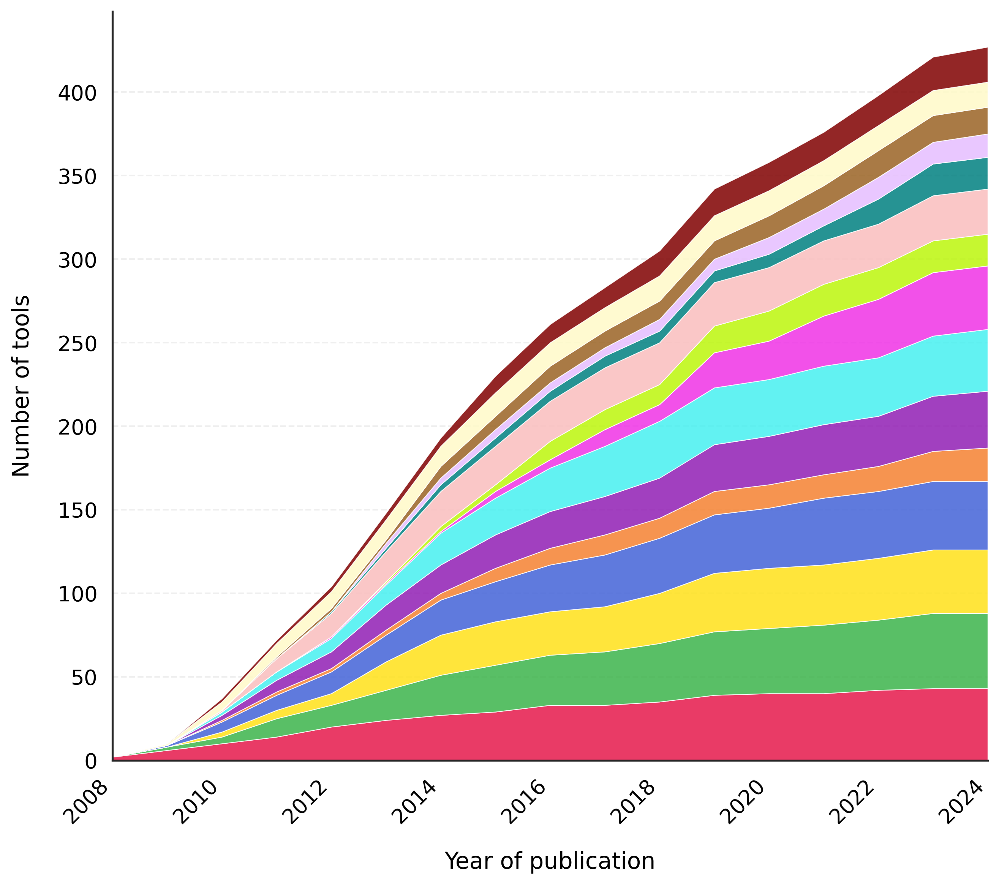

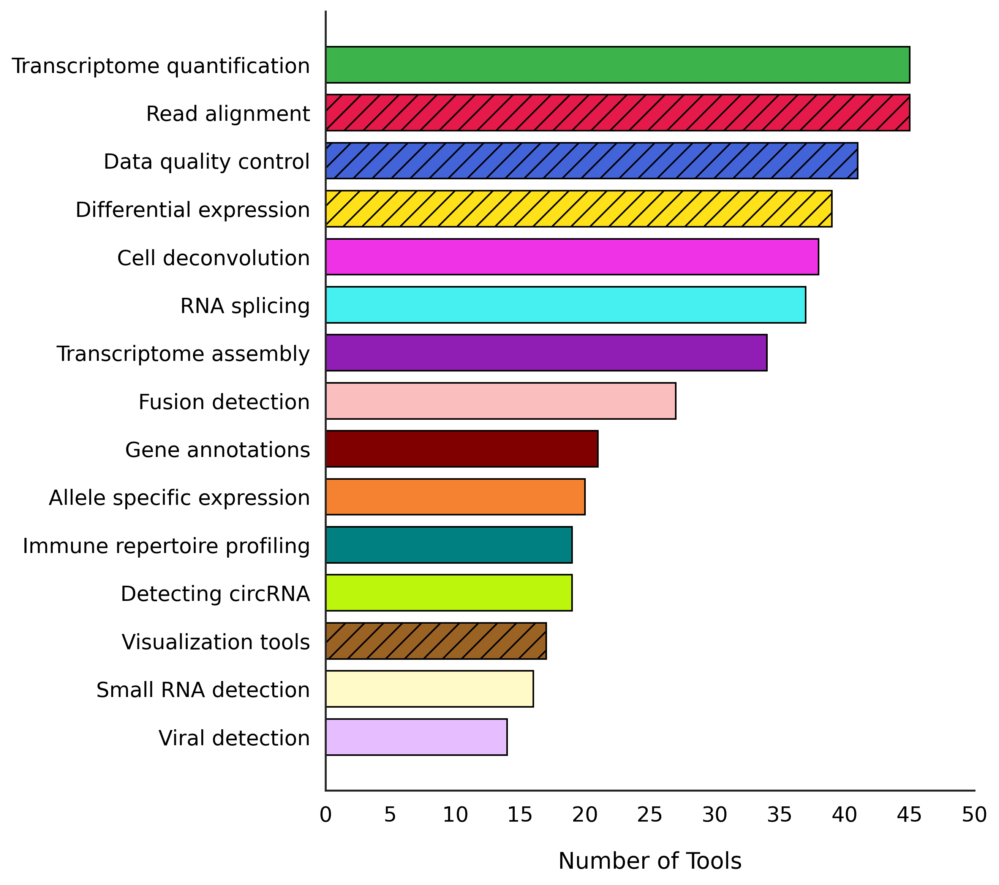

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

LABEL_FONT_SIZE = 16
TICK_FONT_SIZE = 16
FONT_FAMILY = 'DejaVu Sans'
FIG_SIZE = (9, 8)

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'axes.labelsize': LABEL_FONT_SIZE,
    'axes.titlesize': LABEL_FONT_SIZE,
    'xtick.labelsize': TICK_FONT_SIZE,
    'ytick.labelsize': TICK_FONT_SIZE,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# --- Data Preparation ---
file_path = "/content/data.csv"
df = pd.read_csv(file_path, encoding = 'utf-8')

custom_order = [
    'Read alignment', 'Transcriptome quantification', 'Differential expression',
    'Data quality control', 'Allele specific expression', 'Transcriptome assembly',
    'RNA splicing', 'Cell deconvolution', 'Detecting circRNA', 'Fusion detection',
    'Immune repertoire profiling', 'Viral detection', 'Visualization tools',
    'Small RNA detection', 'Gene annotations'
]
custom_colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231',
    '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe',
    '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000'
]

striped_domains = {
    'Read alignment',
    'Data quality control',
    'Differential expression',
    'Visualization tools'
}


# --------- STACKPLOT DATA ---------
df_clean = df[['Domain', 'Year Published']].dropna()
df_clean['Year Published'] = pd.to_numeric(df_clean['Year Published'], errors='coerce')
df_clean = df_clean.dropna()
df_clean = df_clean[df_clean['Domain'].isin(custom_order)]
start_year = 2008
end_year = int(df_clean['Year Published'].max())
domain_counts = df_clean.groupby(['Year Published', 'Domain']).size().unstack(fill_value=0)
full_years = np.arange(start_year, end_year + 1)
domain_counts = domain_counts.reindex(full_years, fill_value=0)
domain_counts = domain_counts.reindex(columns=custom_order, fill_value=0)
domain_counts_cumulative = domain_counts.cumsum()

# --------- BARPLOT DATA ---------
plot_data = df[['Domain', 'Year Published']].copy()
plot_data['Domain'] = plot_data['Domain'].str.replace(r'^[a-zA-Z]\.\s*', '', regex=True).str.strip()
domain_counts_bar = plot_data['Domain'].value_counts().reindex(custom_order).dropna().sort_values(ascending=True)
colors_bar = [custom_colors[custom_order.index(domain)] for domain in domain_counts_bar.index]

# ================== FIGURE 1: STACKPLOT (No Legend) ==================
plt.figure(figsize=FIG_SIZE, dpi=300)
sns.set_style('white')
sns.set_context('notebook', font_scale=1.2)

plt.stackplot(
    domain_counts_cumulative.index,
    domain_counts_cumulative.T,
    colors=custom_colors[:len(custom_order)],
    alpha=0.85,
    edgecolor='white',
    linewidth=0.5
)
plt.ylabel("Number of tools", labelpad=15, color='black')
plt.xlabel("Year of publication", labelpad=15, color='black')
x_ticks = np.arange(start_year, end_year + 1, 2)
plt.xticks(x_ticks, rotation=45, ha='right', color='black')
plt.xlim(start_year, end_year)
plt.tick_params(axis='y', colors='black')
plt.tick_params(axis='x', colors='black')
plt.grid(axis='y', linestyle='--', alpha=0.3)
sns.despine()
plt.tight_layout()

# --- No legend here ---
plt.show()

# ================== FIGURE 2: HORIZONTAL BARPLOT ==================
plt.figure(figsize=FIG_SIZE, dpi=300)
sns.set_style('white')
sns.set_context('notebook', font_scale=1.2)

bars = plt.barh(
    domain_counts_bar.index,
    domain_counts_bar.values,
    color=colors_bar,
    height=0.75,
    edgecolor='black',
    linewidth=1.0
)

# ---- Apply stripes (hatching) to selected domains ----
for bar, domain in zip(bars, domain_counts_bar.index):
    if domain in striped_domains:
        bar.set_hatch('//')


plt.xlabel('Number of Tools', labelpad=16, color='black')
plt.ylabel('', labelpad=16, color='black')
plt.xticks(color='black')
plt.yticks(color='black')
x_max = domain_counts_bar.max() + 5
xtick_locs = np.arange(0, x_max + 5, step=5)
plt.xticks(xtick_locs)
plt.xlim(0, x_max)

sns.despine(left=False, top=True, right=True)
plt.tight_layout()
plt.show()


/tmp/ipython-input-1581142021.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(


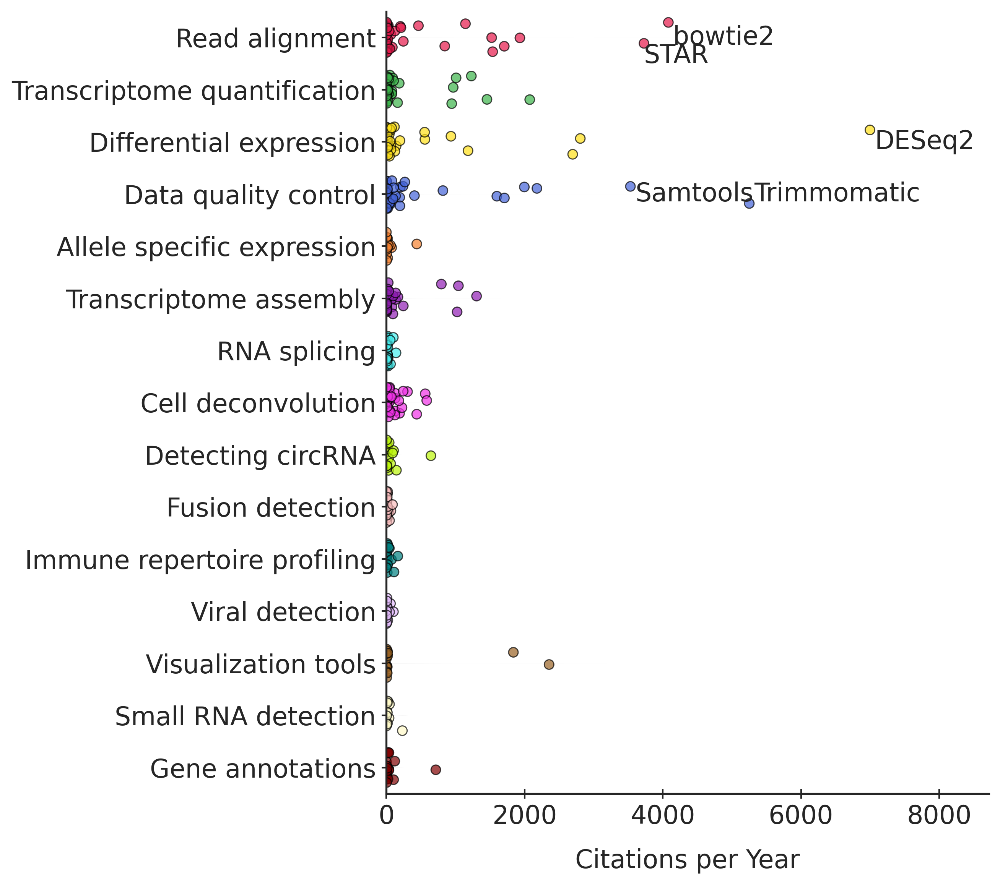

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ========== Standardized style parameters ==========
LABEL_FONT_SIZE = 16
TICK_FONT_SIZE = 16
FONT_FAMILY = 'DejaVu Sans'
FIG_SIZE = (9, 8)

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'axes.labelsize': LABEL_FONT_SIZE,
    'axes.titlesize': LABEL_FONT_SIZE,
    'xtick.labelsize': TICK_FONT_SIZE,
    'ytick.labelsize': TICK_FONT_SIZE,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# ========== Data loading ==========
file_path = "/content/data.csv"
data = pd.read_csv(file_path)

custom_order = [
    'Read alignment', 'Transcriptome quantification', 'Differential expression',
    'Data quality control', 'Allele specific expression', 'Transcriptome assembly',
    'RNA splicing', 'Cell deconvolution', 'Detecting circRNA', 'Fusion detection',
    'Immune repertoire profiling', 'Viral detection', 'Visualization tools',
    'Small RNA detection', 'Gene annotations'
]
custom_colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231',
    '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe',
    '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000'
]

# ========== Data filtering ==========
data = data[data['Domain'].isin(custom_order)]

# ========== Create figure ==========
fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=300)

# Violin plot
sns.violinplot(
    x='Citations per year',
    y='Domain',
    data=data,
    order=custom_order,
    inner=None,
    linewidth=0,
    color='lightgray',
    width=0.3,
    alpha=0.2,
    ax=ax
)

# Strip plot
sns.stripplot(
    x='Citations per year',
    y='Domain',
    data=data,
    order=custom_order,
    palette=custom_colors,
    size=6,
    jitter=0.3,
    edgecolor='black',
    linewidth=0.7,
    alpha=0.7,
    zorder=1,
    ax=ax
)

# Labels
ax.set_xlabel('Citations per Year', fontsize=LABEL_FONT_SIZE, labelpad=12)
ax.set_ylabel('', fontsize=LABEL_FONT_SIZE, labelpad=12)  # No y-label per your new style

# Ticks
ax.tick_params(
    axis='x', labelsize=TICK_FONT_SIZE, direction='inout', length=6, width=1.0,
    bottom=True, top=False
)
ax.tick_params(
    axis='y', labelsize=TICK_FONT_SIZE, direction='inout', length=6, width=1.0,
    left=True, right=False
)

# Axis starts at 0
ax.set_xlim(left=0)

# Spines
sns.despine(ax=ax, top=True, right=True, left=False, bottom=False)

# Annotations
y_pos = {domain: idx for idx, domain in enumerate(custom_order)}
offset = data['Citations per year'].max() * 0.01

# STAR above, Bowtie2 below
for _, row in data[data['Tool names'].isin(['STAR', 'Bowtie2'])].iterrows():
    vertical_offset = 0.35 if row['Tool names'] == 'STAR' else -0.65
    ax.text(
        row['Citations per year'],
        y_pos[row['Domain']] + vertical_offset,
        row['Tool names'],
        va='center',
        ha='left',
        fontsize=LABEL_FONT_SIZE
    )

# Other >3000 tools
high_data = data[(data['Citations per year'] > 3000) & ~data['Tool names'].isin(['STAR', 'Bowtie2'])]
for _, row in high_data.iterrows():
    ax.text(
        row['Citations per year'] + offset,
        y_pos[row['Domain']],
        row['Tool names'],
        va='center',
        fontsize=LABEL_FONT_SIZE
    )

plt.tight_layout()
plt.show()


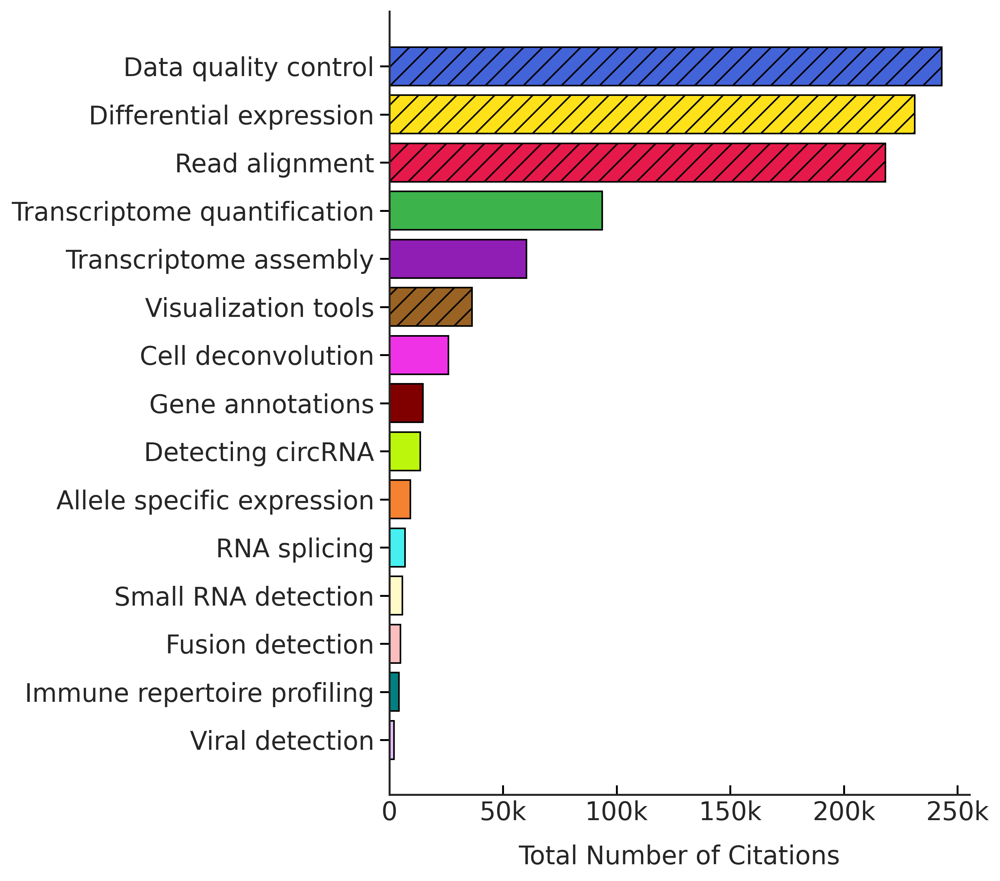

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

# ---- STANDARDIZED STYLE ----
LABEL_FONT_SIZE = 16
TICK_FONT_SIZE = 16
FONT_FAMILY = 'DejaVu Sans'
FIG_SIZE = (9, 8)

hatched_domains = {
    'Read alignment',
    'Data quality control',
    'Differential expression',
    'Visualization tools'
}

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'axes.labelsize': LABEL_FONT_SIZE,
    'axes.titlesize': LABEL_FONT_SIZE,
    'xtick.labelsize': TICK_FONT_SIZE,
    'ytick.labelsize': TICK_FONT_SIZE,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# --- Color & Domain Order ---
custom_order = [
    'Read alignment', 'Transcriptome quantification', 'Differential expression',
    'Data quality control', 'Allele specific expression', 'Transcriptome assembly',
    'RNA splicing', 'Cell deconvolution', 'Detecting circRNA', 'Fusion detection',
    'Immune repertoire profiling', 'Viral detection', 'Visualization tools',
    'Small RNA detection', 'Gene annotations'
]
custom_colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231',
    '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe',
    '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000'
]

# --- Data Preparation ---
file_path = "data.csv"
df = pd.read_csv(file_path)
df.columns = df.columns.str.strip()
df['Domain'] = df['Domain'].astype(str).str.strip()
cit_col = 'Number of citations'

df[cit_col] = pd.to_numeric(df[cit_col], errors='coerce')
df = df.dropna(subset=[cit_col])

# Calculate total citations per domain
domain_cit = df.groupby('Domain')[cit_col].sum()
domain_cit = domain_cit.reindex(custom_order).dropna()

# Sort in descending order
domain_cit = domain_cit.sort_values(ascending=False)
colors_bar = [custom_colors[custom_order.index(domain)] for domain in domain_cit.index]

# --- Plot ---
fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=300)
bars = ax.barh(domain_cit.index, domain_cit.values,
               color=colors_bar, edgecolor='black', linewidth=1.0)

# ---- Apply hatching to selected domains ----
for bar, domain in zip(bars, domain_cit.index):
    if domain in hatched_domains:
        bar.set_hatch('//')   # options: '//', 'xx', '\\\\', 'oo', '++'


ax.invert_yaxis()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.grid(False)

# Labels
ax.set_xlabel('Total Number of Citations', fontsize=LABEL_FONT_SIZE, labelpad=12)
ax.set_ylabel('', fontsize=LABEL_FONT_SIZE, labelpad=12)  # No y-label by default

# Ticks
ax.tick_params(axis='x', labelsize=TICK_FONT_SIZE, direction='in', length=6, width=1.2, color='black', bottom=True, top=False)
ax.tick_params(axis='y', labelsize=TICK_FONT_SIZE, direction='out', length=6, width=1.2, color='black', left=True, right=False)

# Formatter for x-axis
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, pos: f'{int(x/1000)}k' if x >= 1000 else f'{int(x)}'))

plt.tight_layout()
plt.show()


/tmp/ipython-input-3691294120.py:38: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  ).fillna(False)


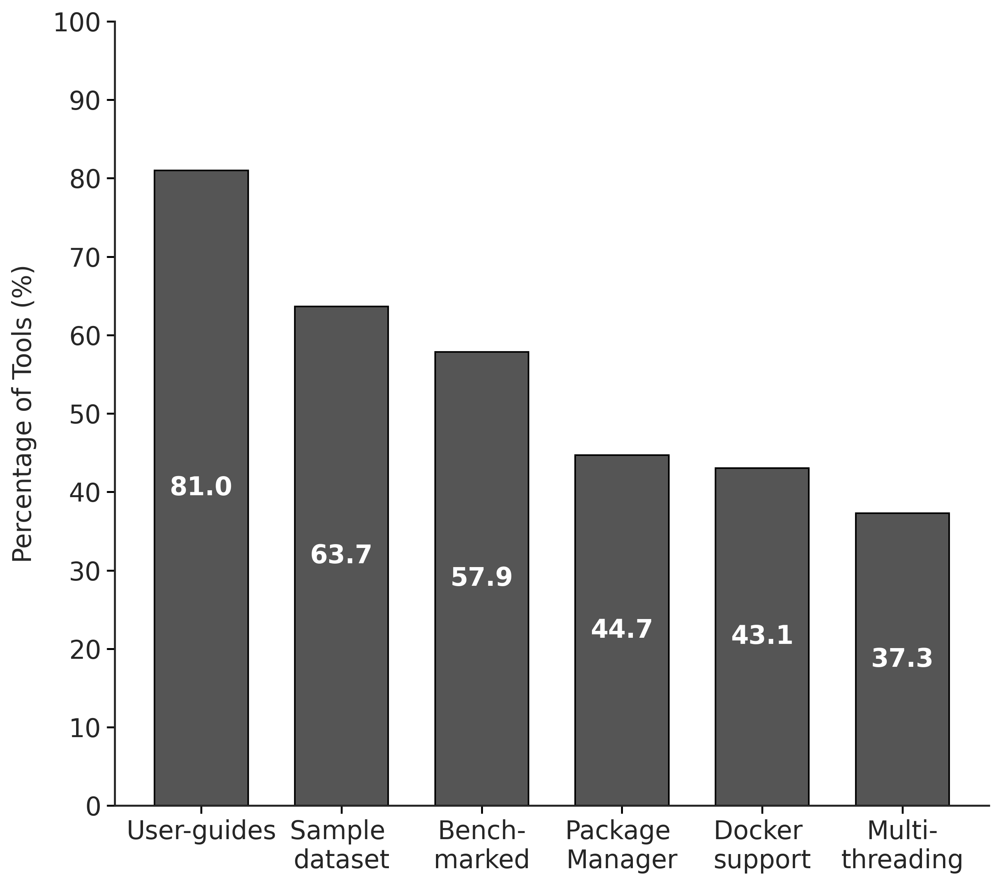

Total number of tools with Package Manager: 193
Total number of tools without Package Manager: 239


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# ---- STANDARDIZED STYLE ----
LABEL_FONT_SIZE = 16
TICK_FONT_SIZE = 16
FONT_FAMILY = 'DejaVu Sans'
FIG_SIZE = (9, 8)

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'axes.labelsize': LABEL_FONT_SIZE,
    'axes.titlesize': LABEL_FONT_SIZE,
    'xtick.labelsize': TICK_FONT_SIZE,
    'ytick.labelsize': TICK_FONT_SIZE,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# Load the dataset
file_path = '/content/data.csv'
df = pd.read_csv(file_path)

# Five PM columns
pm_cols = [
    'Package manager availability - Anaconda',
    'Package manager availability - Bioconductor',
    'Package manager availability - R package manager (includes CRAN)',
    'Package manager availability - Python based package manager (includes pypi)',
    'Package manager availability - Other (homebrew and ubuntu)'
]

# Standardize and convert to boolean, treating NaN/blank as False
for col in pm_cols:
    df[col] = df[col].astype(str).str.strip().str.lower().map(
        {'y': True, 'yes': True, 'n': False, 'no': False}
    ).fillna(False)

# Compute new Has_Package_Manager (ignore original column)
df['Has_Package_Manager_CALC'] = df[pm_cols].any(axis=1).map({True: 'Y', False: 'N'})

# Continue with your existing features
columns = [
    'Has_Documentation',
    'Has_Package_Manager_CALC',  # Use calculated
    'Has_Toy_Examples',
    'Comparison to other tools in the original publication - only note whether benchmarked or not.',
    'Docker support',
    'Thread availability'
]
pretty_labels = [
    'User-guides',
    'Package \nManager',
    'Sample \ndataset',
    'Bench-\nmarked',
    'Docker \nsupport',
    'Multi-\nthreading'
]

# Standardize all columns as uppercase Y/N (for consistency)
df[columns] = df[columns].apply(lambda col: col.astype(str).str.strip().str.upper())
total_tools = len(df)
percents_yes = [(df[col] == 'Y').sum() / total_tools * 100 for col in columns]

# Sort by percentage (descending)
sorted_data = sorted(zip(pretty_labels, percents_yes), key=lambda x: x[1], reverse=True)
sorted_labels, sorted_percents = zip(*sorted_data)

available_color = '#555555'
edge_color = 'black'
bar_width = 0.2
spacing_factor = 0.3
x = [i * spacing_factor for i in range(len(sorted_labels))]

fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=300)
bars_yes = ax.bar(x, sorted_percents, color=available_color,
                  edgecolor=edge_color, linewidth=1, width=bar_width)

for bar in bars_yes:
    height = bar.get_height()
    if height > 0:
        ax.text(bar.get_x() + bar.get_width() / 2,
                bar.get_y() + height / 2,
                f'{height:.1f}',
                ha='center', va='center',
                fontsize=LABEL_FONT_SIZE, color='white', fontweight='bold')

ax.set_ylabel('Percentage of Tools (%)', fontsize=LABEL_FONT_SIZE, labelpad=10)
ax.set_xlabel('', fontsize=LABEL_FONT_SIZE)
ax.set_xticks(x)
ax.set_xticklabels(sorted_labels, rotation=0, ha='center', fontsize=LABEL_FONT_SIZE)
ax.set_ylim(0, 100)

ax.set_yticks(range(0, 101, 10))
ax.set_yticklabels([str(i) for i in range(0, 101, 10)], fontsize=LABEL_FONT_SIZE)

ax.xaxis.set_ticks(x, minor=False)
ax.yaxis.set_ticks(range(0, 101, 10), minor=False)

ax.tick_params(axis='y', which='major', direction='out', length=5, width=1.2, color='black',
               labelsize=LABEL_FONT_SIZE, left=True, right=False)
ax.tick_params(axis='x', which='major', direction='out', length=5, width=1.2, color='black',
               labelsize=LABEL_FONT_SIZE, bottom=True, top=False)

ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

plt.tight_layout()
plt.show()

# Calculate and print number of tools with and without Package Manager
pm_col = 'Has_Package_Manager_CALC'
num_with_pm = (df[pm_col] == 'Y').sum()
num_without_pm = (df[pm_col] == 'N').sum()
print(f"Total number of tools with Package Manager: {num_with_pm}")
print(f"Total number of tools without Package Manager: {num_without_pm}")


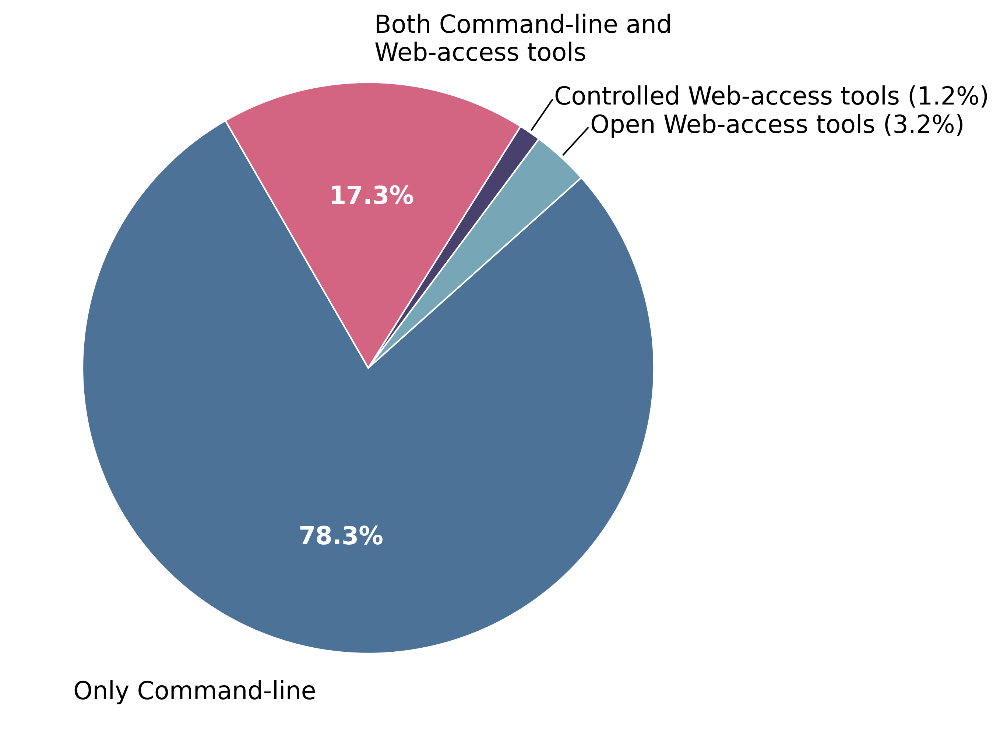

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# --- Standardized Style ---
LABEL_FONT_SIZE = 16
FONT_FAMILY = 'DejaVu Sans'
FIG_SIZE = (9, 8)

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'axes.labelsize': LABEL_FONT_SIZE,
    'axes.titlesize': LABEL_FONT_SIZE,
    'xtick.labelsize': LABEL_FONT_SIZE,
    'ytick.labelsize': LABEL_FONT_SIZE,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# --- Data ---
file_path = "/content/data.csv"
data = pd.read_csv(file_path)
data.columns = data.columns.str.strip()

def to_bin(val):
    return 1 if str(val).strip().upper() == 'Y' else 0

data['Command-line'] = data['Command-line'].apply(to_bin)
data['Web-based'] = data['Web-based'].apply(to_bin)
data['Controlled access'] = data['Controlled access (for web-based): does it require login or sign up or payment?'].apply(to_bin)

only_cmd = ((data['Command-line'] == 1) & (data['Web-based'] == 0)).sum()
only_web_open = ((data['Command-line'] == 0) & (data['Web-based'] == 1) & (data['Controlled access'] == 0)).sum()
controlled_web = ((data['Command-line'] == 0) & (data['Web-based'] == 1) & (data['Controlled access'] == 1)).sum()
both = ((data['Command-line'] == 1) & (data['Web-based'] == 1)).sum()

sizes = [only_cmd, only_web_open, controlled_web, both]
total = sum(sizes)
percents = [100 * s / total for s in sizes]

# For controlled and open web, add % to label; for others, use plain label
labels = [
    'Only Command-line',
    f'Open Web-access tools ({percents[1]:.1f}%)',
    f'Controlled Web-access tools ({percents[2]:.1f}%)',
    'Both Command-line and \nWeb-access tools'
]
colors = ['#4D7298', '#77A6B6', '#49416D', '#D36582']

fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=300)
wedges, texts = ax.pie(
    sizes,
    labels=labels,
    colors=colors,
    startangle=120,
    textprops={'fontsize': LABEL_FONT_SIZE, 'color': 'black'},
    wedgeprops={'edgecolor': 'white', 'linewidth': 1},
    labeldistance=1.15
)

# Add white percent text INSIDE each wedge if >= 5%
for i, p in enumerate(wedges):
    if percents[i] >= 5:
        ang = (p.theta2 - p.theta1)/2. + p.theta1
        y = np.sin(np.deg2rad(ang)) * 0.6
        x = np.cos(np.deg2rad(ang)) * 0.6
        percent_text = f"{percents[i]:.1f}%"
        ax.text(
            x, y, percent_text,
            ha='center', va='center',
            fontsize=LABEL_FONT_SIZE,
            color='white',
            fontweight='bold'
        )

# Only add leader lines for Open Web-access and Controlled Web-access
for idx in [1, 2]:
    p = wedges[idx]
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    ax.annotate(
        '',
        xy=(x, y),
        xytext=(1.15 * x, 1.15 * y),
        arrowprops=dict(arrowstyle="-", color='black', connectionstyle=connectionstyle),
        size=LABEL_FONT_SIZE
    )

plt.tight_layout()
plt.show()


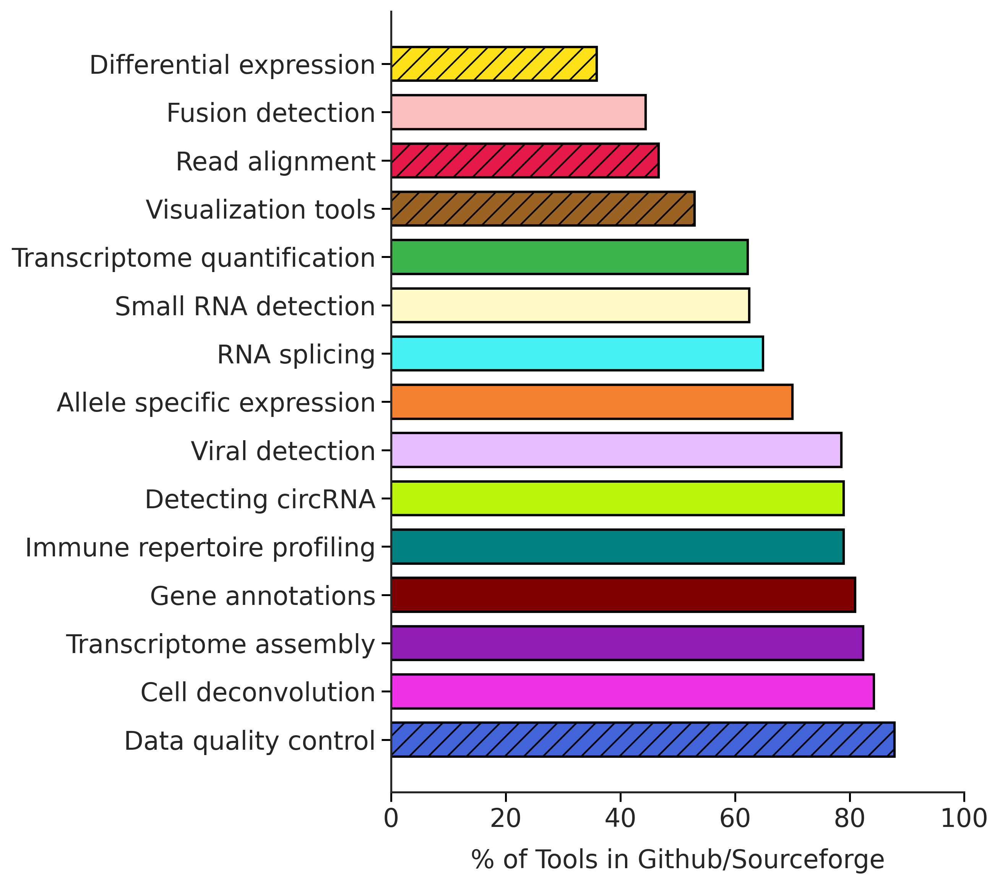

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Standardized style ---
LABEL_FONT_SIZE = 16
TICK_FONT_SIZE = 16
FONT_FAMILY = 'DejaVu Sans'
FIG_SIZE = (9, 8)

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'axes.labelsize': LABEL_FONT_SIZE,
    'axes.titlesize': LABEL_FONT_SIZE,
    'xtick.labelsize': TICK_FONT_SIZE,
    'ytick.labelsize': TICK_FONT_SIZE,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# --- Domain color order ---
custom_order = [
    'Read alignment', 'Transcriptome quantification', 'Differential expression',
    'Data quality control', 'Allele specific expression', 'Transcriptome assembly',
    'RNA splicing', 'Cell deconvolution', 'Detecting circRNA', 'Fusion detection',
    'Immune repertoire profiling', 'Viral detection', 'Visualization tools',
    'Small RNA detection', 'Gene annotations'
]
custom_colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231',
    '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe',
    '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000'
]

hatched_domains = {
    'Read alignment',
    'Data quality control',
    'Differential expression',
    'Visualization tools'
}

# --- Data loading and preparation ---
file_path = "/content/data.csv"
data = pd.read_csv(file_path)
data.columns = data.columns.str.strip()
data['Domain'] = data['Domain'].astype(str).str.strip()

col = 'Number of releases for Github/Sourceforge'
data[col] = pd.to_numeric(data[col], errors='coerce').fillna(0)
data['Has_Github'] = data[col].apply(lambda x: 1 if x > 0 else 0)

grouped = data.groupby('Domain')['Has_Github'].sum()
count_per_domain = data.groupby('Domain')['Tool names'].count()
percent_present = (grouped / count_per_domain * 100).fillna(0)
present_df = percent_present.reindex(custom_order).dropna()

# --- Sort in descending order ---
present_df = present_df.sort_values(ascending=False)

# --- Assign colors by domain for sorted DataFrame ---
domain_to_color = dict(zip(custom_order, custom_colors))
bar_colors = [domain_to_color[dom] for dom in present_df.index]

# --- Plot ---
fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=300)
bars = ax.barh(
    present_df.index,
    present_df.values,
    color=bar_colors,
    edgecolor='black',
    linewidth=1.5,
    height=0.7
)

# --- Apply hatching to selected domains ---
for bar, domain in zip(bars, present_df.index):
    if domain in hatched_domains:
        bar.set_hatch('//')  # options: '//', 'xx', '\\\\', 'oo', '++'

ax.set_xlabel('% of Tools in Github/Sourceforge', fontsize=LABEL_FONT_SIZE, labelpad=10)
ax.set_ylabel('', fontsize=LABEL_FONT_SIZE)
ax.set_xlim(0, 100)

ax.tick_params(axis='y', which='major', direction='out', length=6, width=1.2, color='black', labelsize=LABEL_FONT_SIZE, left=True, right=False)
ax.tick_params(axis='x', which='major', direction='out', length=6, width=1.2, color='black', labelsize=LABEL_FONT_SIZE, bottom=True, top=False)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

plt.tight_layout()
plt.show()


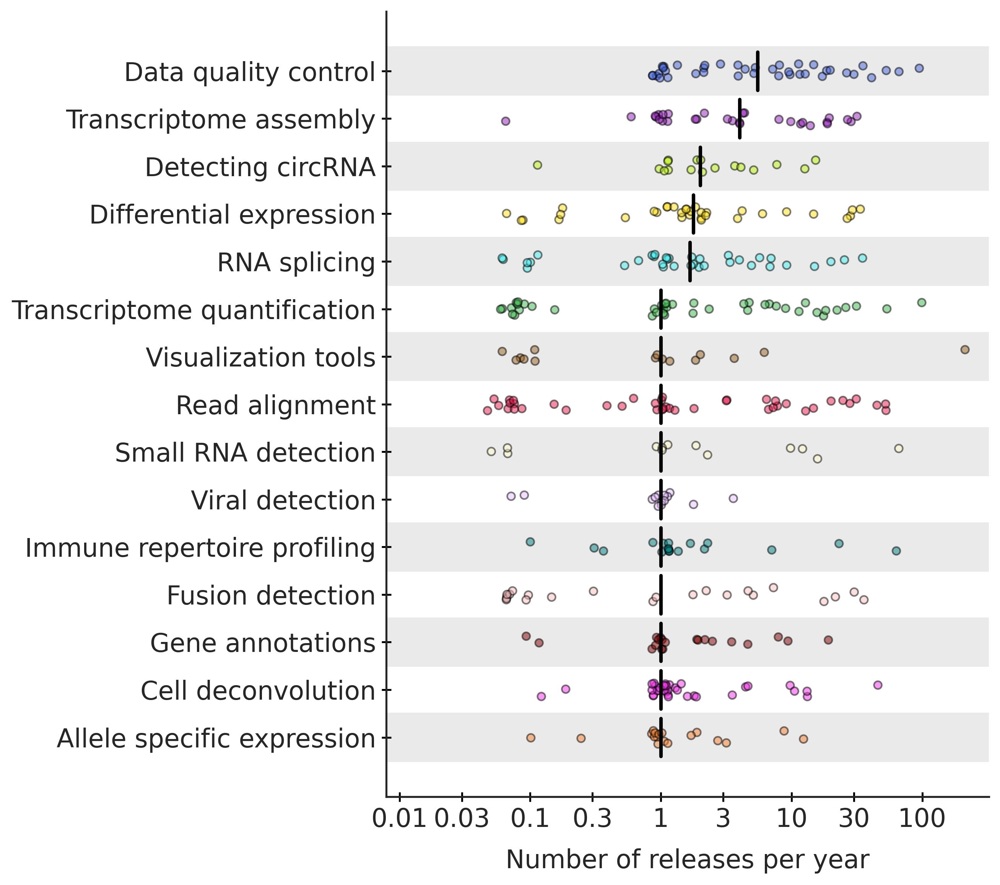

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# --- Standardized Style ---
LABEL_FONT_SIZE = 16
TICK_FONT_SIZE = 16
FONT_FAMILY = 'DejaVu Sans'
FIG_SIZE = (9, 8)

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'axes.labelsize': LABEL_FONT_SIZE,
    'axes.titlesize': LABEL_FONT_SIZE,
    'xtick.labelsize': TICK_FONT_SIZE,
    'ytick.labelsize': TICK_FONT_SIZE,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# --- Custom colors and domain order ---
custom_order = [
    'Read alignment', 'Transcriptome quantification', 'Differential expression',
    'Data quality control', 'Allele specific expression', 'Transcriptome assembly',
    'RNA splicing', 'Cell deconvolution', 'Detecting circRNA', 'Fusion detection',
    'Immune repertoire profiling', 'Viral detection', 'Visualization tools',
    'Small RNA detection', 'Gene annotations'
]
custom_colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231',
    '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe',
    '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000'
]

# Load your dataset
file_path = "/content/data.csv"
data = pd.read_csv(file_path)

# Clean column names and domain values
data.columns = data.columns.str.strip()
data['Domain'] = data['Domain'].astype(str).str.strip()

# Release columns
release_cols_per_year = [
    'Number of Releases per Year for standalone website',
    'Number of releases per year for Anaconda',
    'Number of releases per year for Pypi',
    'Number of releases per year for CRAN',
    'Number of releases per year for Bioconductor',
    'Number of releases for Github/Sourceforge'
]

# Ensure numeric conversion
for col in release_cols_per_year:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Prepare data
df = data.dropna(subset=release_cols_per_year, how='all').copy()
df['Total_releases_per_year'] = df[release_cols_per_year].sum(axis=1, skipna=True)
df = df[df['Total_releases_per_year'] > 0]
df['Repo_release_per_year'] = df[release_cols_per_year].max(axis=1, skipna=True)
df = df[df['Repo_release_per_year'] > 0]
df['release_log10'] = np.log10(df['Repo_release_per_year'])

# Sort domains by median for y-axis order
domain_medians = df.groupby('Domain')['release_log10'].median().sort_values()
sorted_domains = list(domain_medians.index)
domain_to_y = {domain: i for i, domain in enumerate(sorted_domains)}
df['domain_y'] = df['Domain'].map(domain_to_y)

# Jitter for better visualization
np.random.seed(1)
jitter_strength_x = 0.07
jitter_strength_y = 0.3
df['release_log10_jitter'] = df['release_log10'] + np.random.uniform(-jitter_strength_x, jitter_strength_x, size=len(df))
df['domain_y_spaced'] = df['domain_y'] * 2 + np.random.uniform(-jitter_strength_y, jitter_strength_y, size=len(df))

# Map domains to colors
domain_color_map = dict(zip(custom_order, custom_colors))
default_color = "#AAAAAA"
df['color'] = df['Domain'].map(domain_color_map).fillna(default_color)

# --- Plot ---
fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=300)

# Background shading (optional, currently enabled)
for i in range(len(sorted_domains)):
    y_val = i * 2
    if i % 2 == 0:
        ax.axhspan(y_val - 1, y_val + 1, color="#eaeaea", zorder=0)

# Scatter: colored dots by domain
ax.scatter(
    df['release_log10_jitter'],
    df['domain_y_spaced'],
    c=df['color'],
    edgecolor='black',
    marker='o',
    s=24,
    alpha=0.5,
    zorder=10
)

# Median lines for each domain
for i, dom in enumerate(sorted_domains):
    dom_df = df[df['Domain'] == dom]
    if len(dom_df) == 0:
        continue
    median_x = dom_df['release_log10'].median()
    y_val = i * 2
    ax.plot([median_x, median_x], [y_val - 0.8, y_val + 0.8], color='black', lw=2.2, zorder=20)

# X-ticks (log scale, human-readable)
tick_labels = [0.01, 0.03, 0.1, 0.3, 1, 3, 10, 30, 100]
tick_positions = np.log10(tick_labels)
ax.set_xticks(tick_positions)
ax.set_xticklabels([str(x) for x in tick_labels])
ax.set_xlim(left=min(tick_positions) - 0.1)

# Y-ticks
ax.set_yticks([i * 2 for i in range(len(sorted_domains))])
ax.set_yticklabels(sorted_domains, fontsize=LABEL_FONT_SIZE)

# Labels
ax.set_xlabel('Number of releases per year', fontsize=LABEL_FONT_SIZE, labelpad=10)
ax.set_ylabel('', fontsize=LABEL_FONT_SIZE)

# Ticks
ax.tick_params(axis='x', which='both', direction='inout', length=6, width=1.2,
               color='black', bottom=True, labelsize=LABEL_FONT_SIZE)
ax.tick_params(axis='y', which='both', direction='inout', length=6, width=1.2,
               color='black', left=True, labelsize=LABEL_FONT_SIZE)

# Spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

plt.tight_layout()
plt.show()


/tmp/ipython-input-2429508680.py:52: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(pad=1.2)


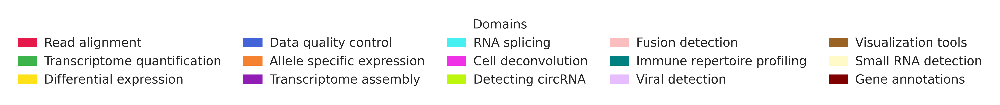

In [ ]:
import matplotlib.pyplot as plt

# Your domain order and colors from earlier
custom_order = [
    'Read alignment', 'Transcriptome quantification', 'Differential expression',
    'Data quality control', 'Allele specific expression', 'Transcriptome assembly',
    'RNA splicing', 'Cell deconvolution', 'Detecting circRNA', 'Fusion detection',
    'Immune repertoire profiling', 'Viral detection', 'Visualization tools',
    'Small RNA detection', 'Gene annotations'
]
custom_colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231',
    '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe',
    '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000'
]

LABEL_FONT_SIZE = 16
FONT_FAMILY = 'DejaVu Sans'

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# Create color handles for the legend
handles = [
    plt.Rectangle((0, 0), 1, 1, color=custom_colors[i])
    for i in range(len(custom_order))
]

# --- Create the figure and legend only ---
fig, ax = plt.subplots(figsize=(8, 2.2), dpi=300)
ax.axis('off')  # Hide axes

# Place the legend: 5 columns, 3 rows
legend = ax.legend(
    handles, custom_order,
    loc='center',
    ncol=5,  # 5 per row
    frameon=False,
    borderpad=1.0,
    handlelength=1.5,
    columnspacing=1.8,
    handletextpad=0.6,
    bbox_to_anchor=(0.5, 0.5),
    fontsize=LABEL_FONT_SIZE,
    title='Domains'
)

plt.tight_layout(pad=1.2)
plt.show()


/tmp/ipython-input-1938075546.py:50: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  ).fillna(False)


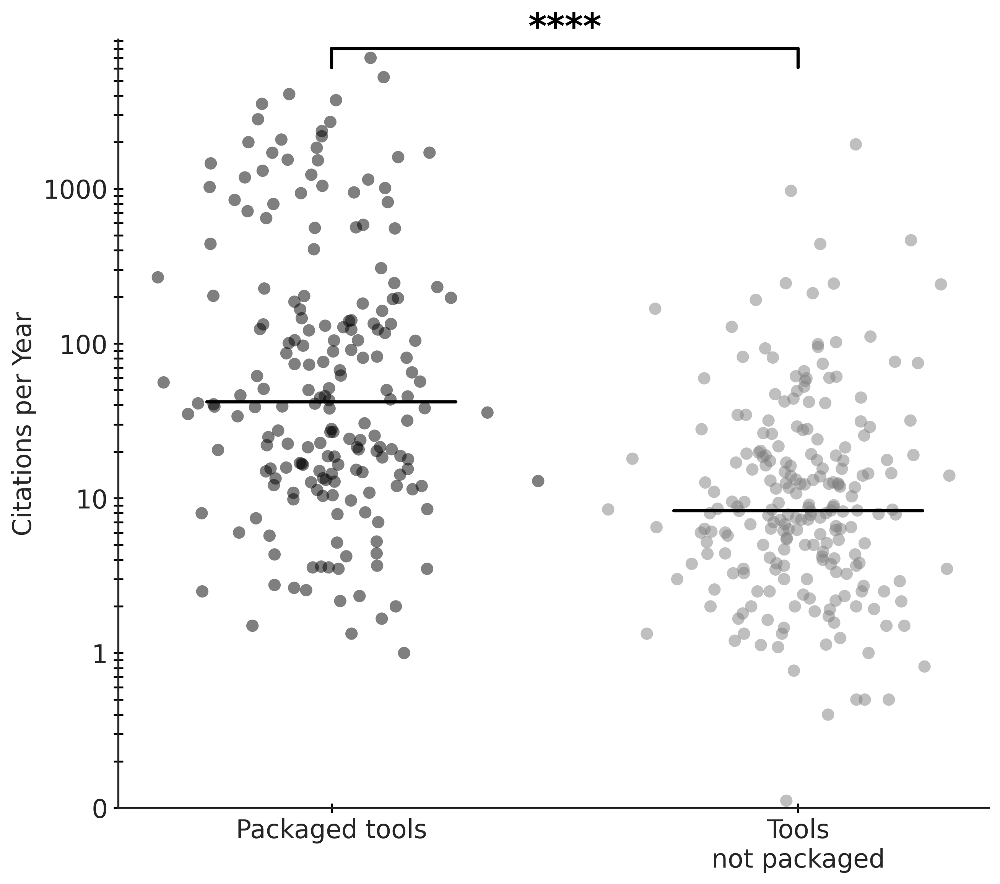

Mann-Whitney U Test Results: (Package Manager)
U statistic: 9945.50
P-value: 5.05e-21
Packaged tools: 192 tools analyzed (out of 193; 1 excluded due to missing citations)
Tools
not packaged: 223 tools analyzed (out of 239; 16 excluded due to missing citations)
--------------------------------------------------


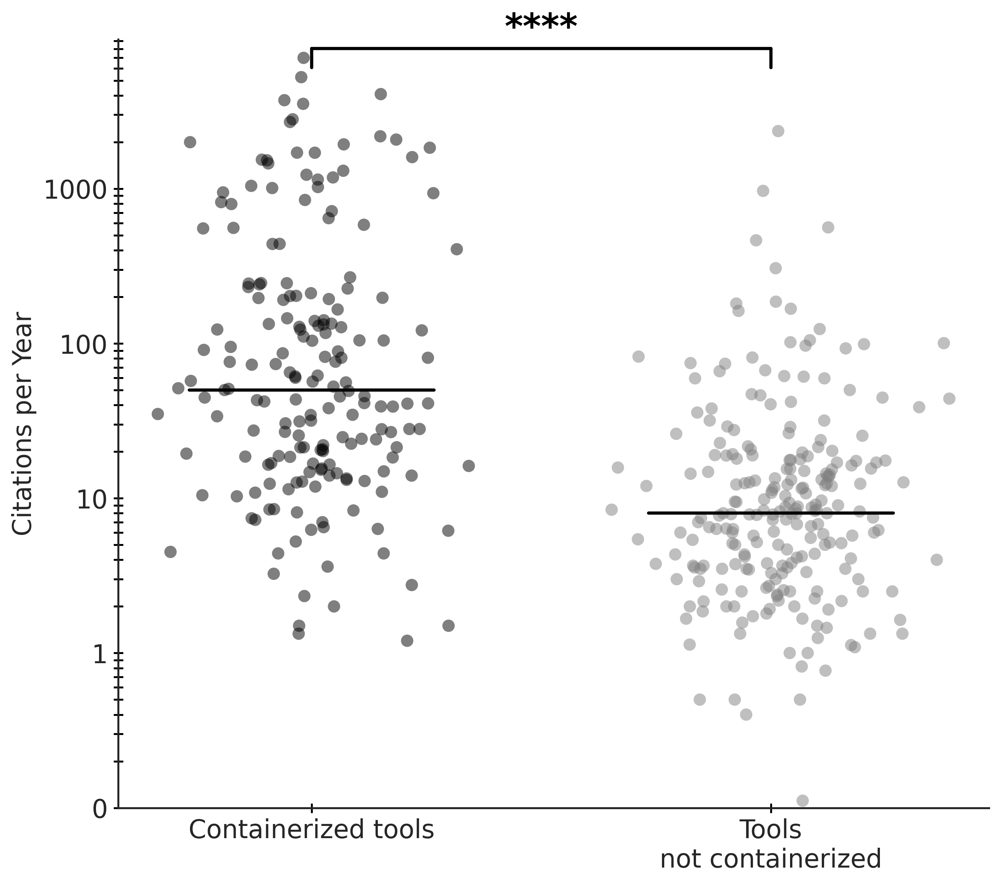

Mann-Whitney U Test Results: (Docker)
U statistic: 8142.00
P-value: 4.00e-27
Containerized tools: 183 tools analyzed (out of 186; 3 excluded due to missing citations)
Tools
not containerized: 232 tools analyzed (out of 246; 14 excluded due to missing citations)
--------------------------------------------------


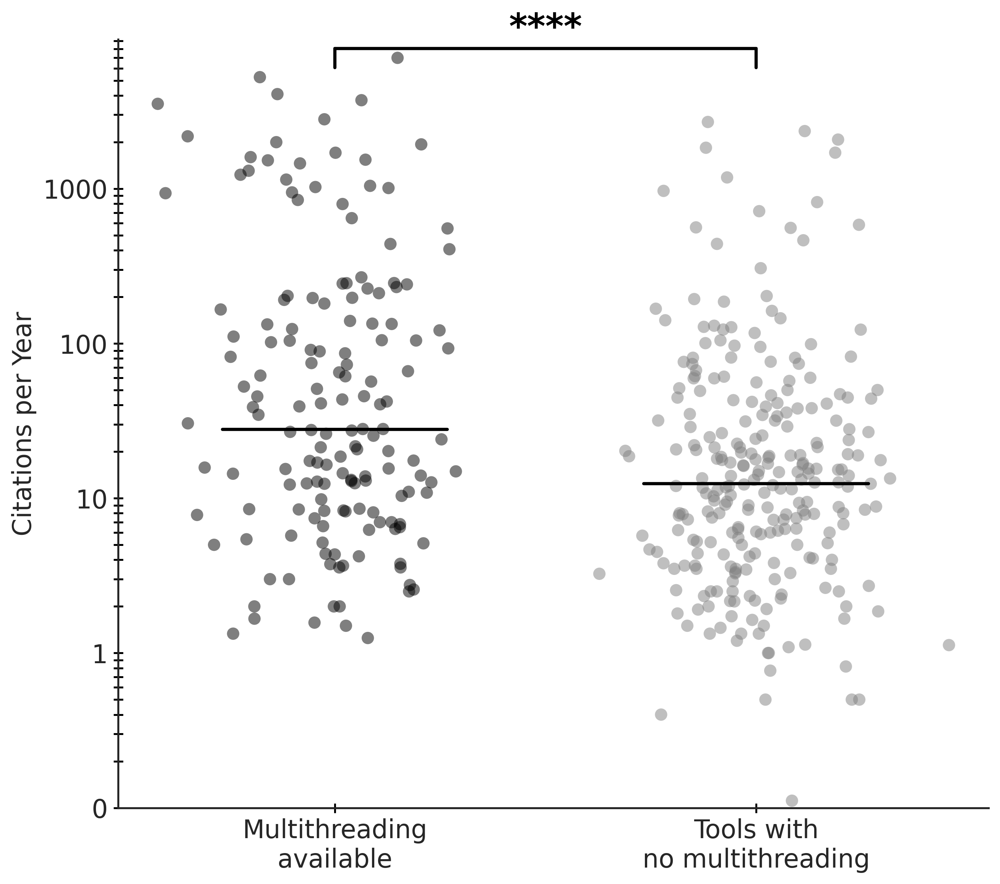

Mann-Whitney U Test Results: (Multithreading)
U statistic: 14278.00
P-value: 3.82e-07
Multithreading
available: 158 tools analyzed (out of 161; 3 excluded due to missing citations)
Tools with
no multithreading: 257 tools analyzed (out of 271; 14 excluded due to missing citations)
--------------------------------------------------


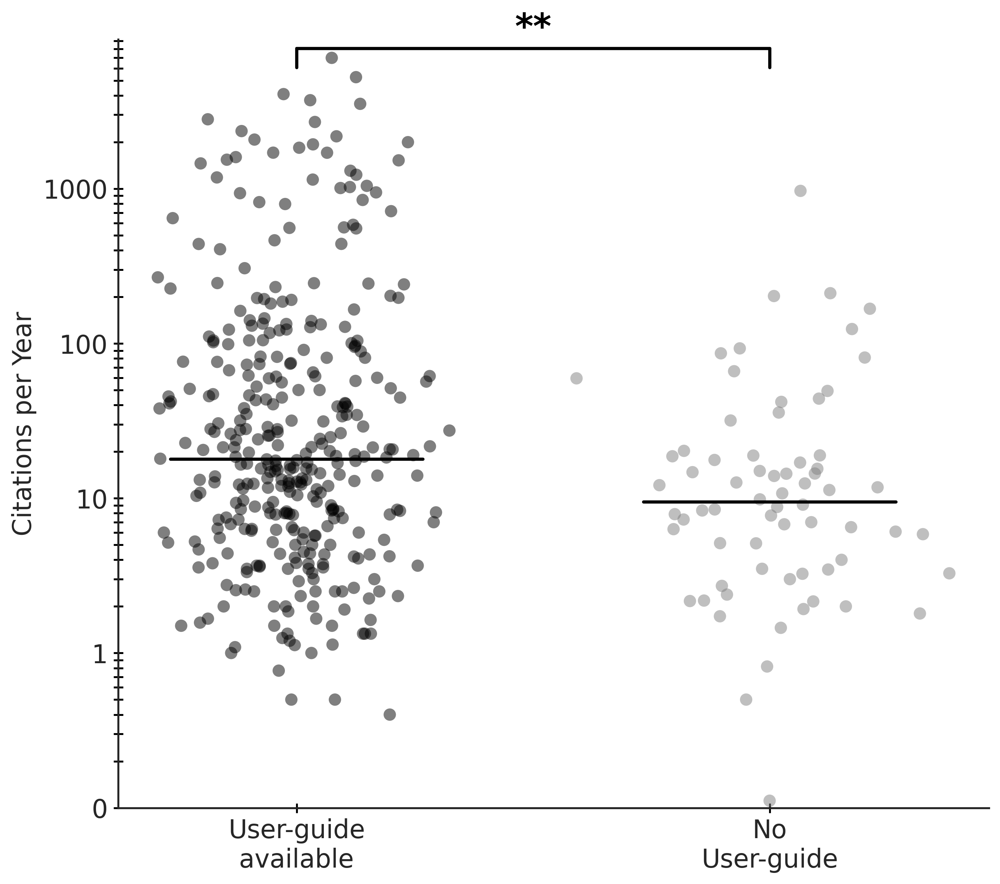

Mann-Whitney U Test Results: (User-guides)
U statistic: 8859.00
P-value: 1.16e-03
User-guide
available: 347 tools analyzed (out of 350; 3 excluded due to missing citations)
No
User-guide: 68 tools analyzed (out of 82; 14 excluded due to missing citations)
--------------------------------------------------


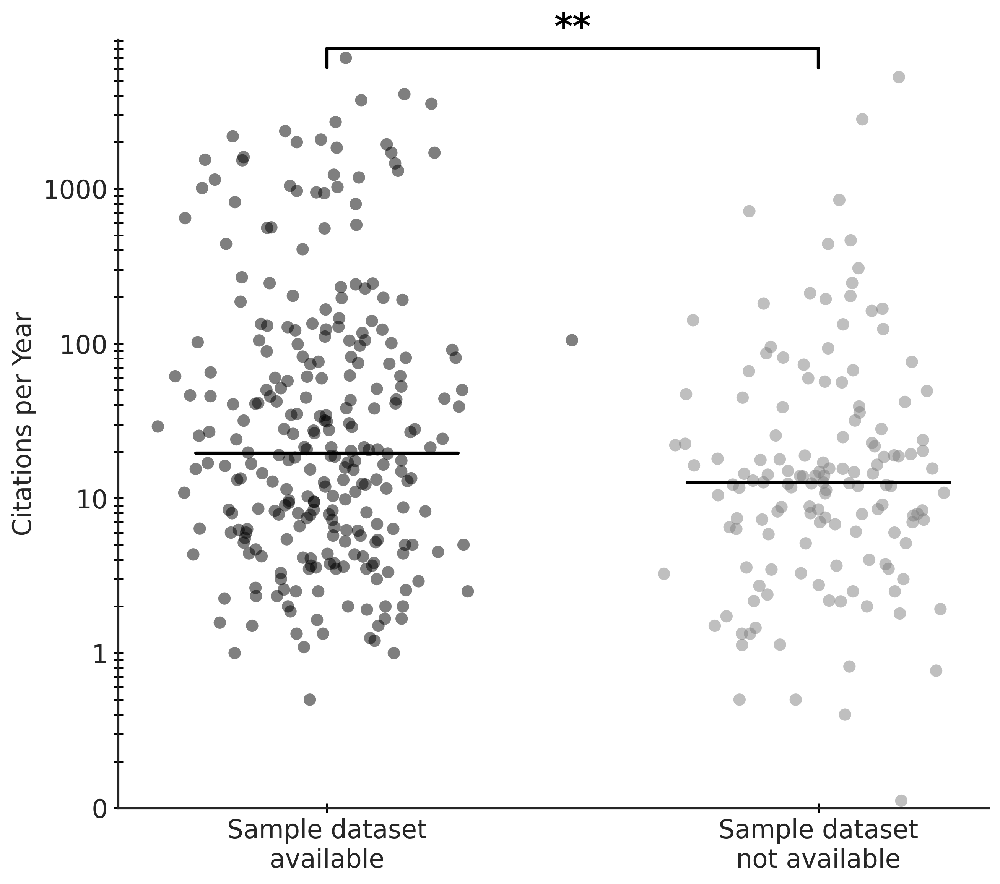

Mann-Whitney U Test Results: (Toy Examples)
U statistic: 16215.00
P-value: 5.37e-03
Sample dataset
available: 272 tools analyzed (out of 275; 3 excluded due to missing citations)
Sample dataset
not available: 143 tools analyzed (out of 157; 14 excluded due to missing citations)
--------------------------------------------------


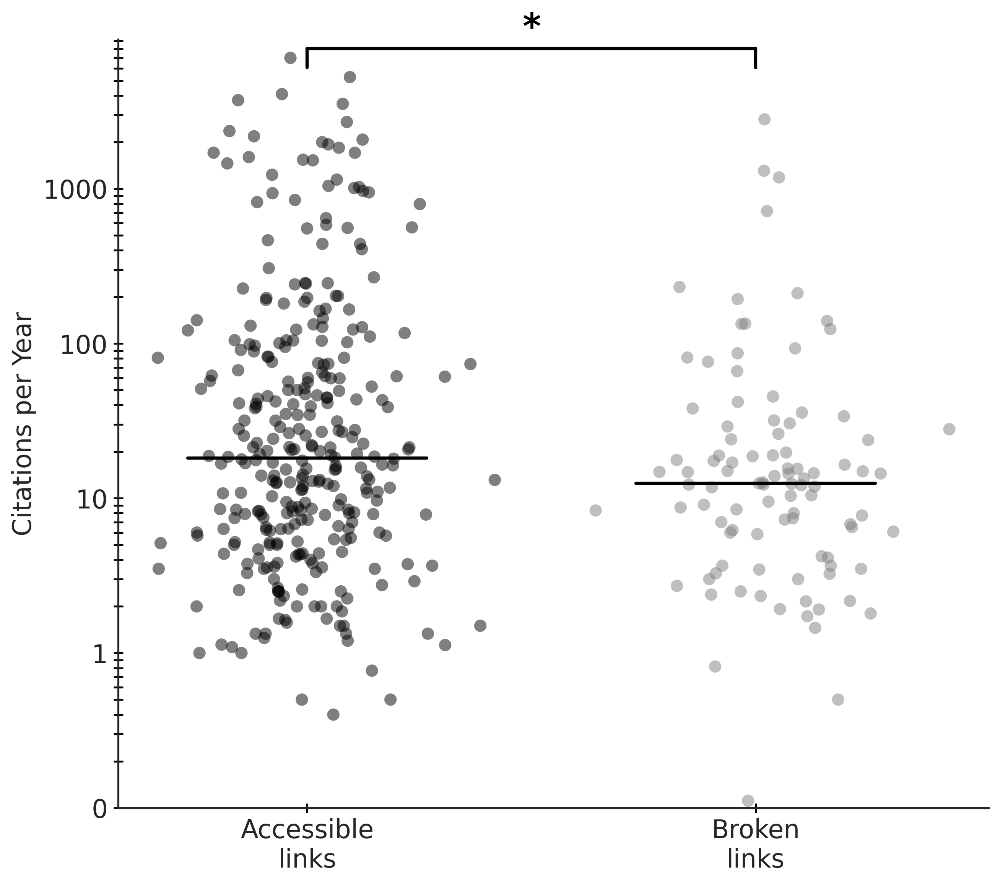

Mann-Whitney U Test Results: (Link Accessibility)
U statistic: 13018.50
P-value: 2.01e-02
Accessible
links: 318 tools analyzed (out of 333; 15 excluded due to missing citations)
Broken
links: 97 tools analyzed (out of 99; 2 excluded due to missing citations)
--------------------------------------------------


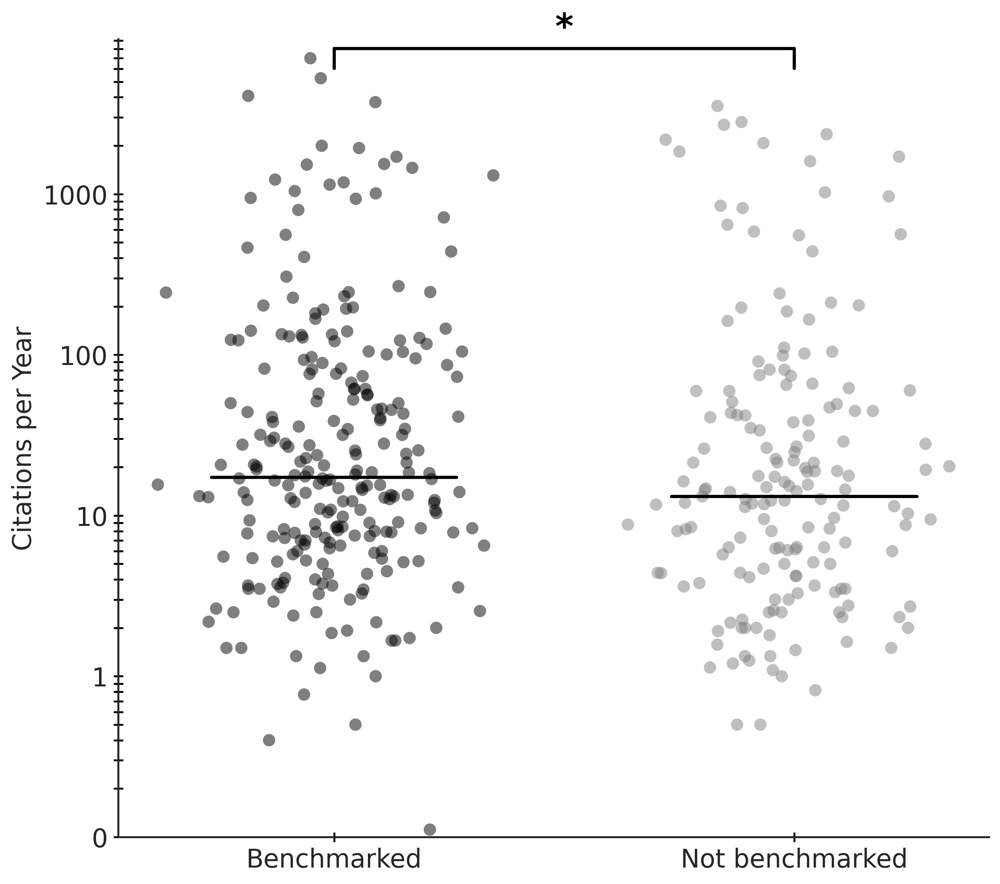

Mann-Whitney U Test Results: (Benchmarking)
U statistic: 18355.00
P-value: 4.28e-02
Benchmarked: 246 tools analyzed (out of 250; 4 excluded due to missing citations)
Not benchmarked: 169 tools analyzed (out of 182; 13 excluded due to missing citations)
--------------------------------------------------


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import mannwhitneyu
import matplotlib.ticker as mticker

# --- Standardized Style ---
LABEL_FONT_SIZE = 16
TICK_FONT_SIZE = 16
FONT_FAMILY = 'DejaVu Sans'
FIG_SIZE = (9, 8)

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'axes.labelsize': LABEL_FONT_SIZE,
    'axes.titlesize': LABEL_FONT_SIZE,
    'xtick.labelsize': TICK_FONT_SIZE,
    'ytick.labelsize': TICK_FONT_SIZE,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# --- Load data once ---
df = pd.read_csv('/content/data.csv')

# --- Preprocessing to standardize columns ---
for col in [
    'Docker support',
    'Thread availability',
    'Has_Documentation',
    'Has_Toy_Examples',
    'Link is Broken',
    'Comparison to other tools in the original publication - only note whether benchmarked or not.'
]:
    if col in df.columns:
        df[col] = df[col].apply(lambda x: 'Y' if str(x).upper().strip() in ['Y', 'YES'] else 'N')

# --- Robust Package Manager Calculation ---
pm_cols = [
    'Package manager availability - Anaconda',
    'Package manager availability - Bioconductor',
    'Package manager availability - R package manager (includes CRAN)',
    'Package manager availability - Python based package manager (includes pypi)',
    'Package manager availability - Other (homebrew and ubuntu)'
]
for col in pm_cols:
    df[col] = df[col].astype(str).str.strip().str.lower().map(
        {'y': True, 'yes': True, 'n': False, 'no': False}
    ).fillna(False)
df['Has_Package_Manager_CALC'] = df[pm_cols].any(axis=1).map({True: 'Y', False: 'N'})

# --- Define plot settings for each test ---
tests = [
    {
        'name': 'Package Manager',
        'column': 'Has_Package_Manager_CALC',   # Use robust calculated column
        'labels': ['Packaged tools', 'Tools\nnot packaged'],
        'colors': ['black', 'gray'],
        'prep': lambda d: d,
        'value_for_yes': 'Y',
        'value_for_no': 'N'
    },
    {
        'name': 'Docker',
        'column': 'Docker support',
        'labels': ['Containerized tools', 'Tools\nnot containerized'],
        'colors': ['black', 'gray'],
        'prep': lambda d: d,
        'value_for_yes': 'Y',
        'value_for_no': 'N'
    },
    {
        'name': 'Multithreading',
        'column': 'Thread availability',
        'labels': ['Multithreading\navailable', 'Tools with\nno multithreading'],
        'colors': ['black', 'gray'],
        'prep': lambda d: d,
        'value_for_yes': 'Y',
        'value_for_no': 'N'
    },
    {
        'name': 'User-guides',
        'column': 'Has_Documentation',
        'labels': ['User-guide\navailable', 'No\nUser-guide'],
        'colors': ['black', 'gray'],
        'prep': lambda d: d,
        'value_for_yes': 'Y',
        'value_for_no': 'N'
    },
    {
        'name': 'Toy Examples',
        'column': 'Has_Toy_Examples',
        'labels': ['Sample dataset\navailable', 'Sample dataset\nnot available'],
        'colors': ['black', 'gray'],
        'prep': lambda d: d,
        'value_for_yes': 'Y',
        'value_for_no': 'N'
    },
    {
        'name': 'Link Accessibility',
        'column': 'Link is Broken',
        'labels': ['Accessible\nlinks', 'Broken\nlinks'],
        'colors': ['black', 'gray'],
        'prep': lambda d: d,
        'value_for_yes': 'N',  # "Accessible" means NOT broken!
        'value_for_no': 'Y'
    },
    {
        'name': 'Benchmarking',
        'column': 'Comparison to other tools in the original publication - only note whether benchmarked or not.',
        'labels': ['Benchmarked', 'Not benchmarked'],
        'colors': ['black', 'gray'],
        'prep': lambda d: d,
        'value_for_yes': 'Y',
        'value_for_no': 'N'
    }
]

# --- Main plotting loop ---
for test in tests:
    # Prepare column if needed (robust for Has_Package_Manager)
    df_test = test['prep'](df.copy())
    value_col = test['column']
    if value_col not in df_test.columns:
        continue

    # Prepare data
    df_test['Citations per year'] = pd.to_numeric(df_test['Citations per year'], errors='coerce')
    df_test = df_test.dropna(subset=['Citations per year'])

    # Order: [available group, unavailable/broken group]
    available = df_test[df_test[value_col] == test['value_for_yes']]['Citations per year']
    unavailable = df_test[df_test[value_col] == test['value_for_no']]['Citations per year']

    # For plotting: replace zeros for log scale
    min_non_zero = df_test[df_test['Citations per year'] > 0]['Citations per year'].min()
    min_non_zero = min_non_zero if pd.notna(min_non_zero) and min_non_zero > 0 else 0.1
    available = available.replace(0, min_non_zero / 10)
    unavailable = unavailable.replace(0, min_non_zero / 10)

    # Mann-Whitney U test
    stat, p = mannwhitneyu(unavailable, available, alternative='two-sided')

    # Plot
    fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=300)
    group_positions = [1.0, 1.3]
    labels = test['labels']
    colors = test['colors']
    plot_groups = [available, unavailable]

    # Scatter and median
    for i, group in enumerate(plot_groups):
        x = np.random.normal(group_positions[i], 0.04, size=len(group))
        ax.scatter(x, group, color=colors[i], alpha=0.5, s=60, edgecolor='none', zorder=2)
        median = np.median(group)
        ax.plot([group_positions[i] - 0.08, group_positions[i] + 0.08], [median, median], color='black', linewidth=2, zorder=3)

    # Axis setup
    ax.set_yscale('log')
    ax.set_ylabel('Citations per Year', fontsize=LABEL_FONT_SIZE)
    ax.set_xlabel('', fontsize=LABEL_FONT_SIZE)
    ax.set_xticks(group_positions)
    ax.set_xticklabels(labels, fontsize=LABEL_FONT_SIZE)

    # Ticks
    ax.tick_params(axis='x', which='both', direction='inout', length=6, width=1.2, color='black', bottom=True, labelsize=LABEL_FONT_SIZE)
    ax.tick_params(axis='y', which='both', direction='inout', length=6, width=1.2, color='black', left=True, labelsize=LABEL_FONT_SIZE)

    # Spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(True)
    ax.spines['bottom'].set_visible(True)

    # Y-ticks
    yticks = [0.1, 1, 10, 100, 1000, 10000]
    ax.set_yticks(yticks)
    ax.get_yaxis().set_major_formatter(mticker.ScalarFormatter())

    # Significance annotation
    all_y = np.concatenate(plot_groups)
    max_dot = np.max(all_y)
    bar_y = max_dot * 1.15
    star_y = max_dot * 1.20
    ax.set_ylim(min(yticks), star_y * 1.10)

    ax.plot([group_positions[0], group_positions[1]], [bar_y, bar_y], color='black', lw=2)
    tick_height = 0.75
    ax.plot([group_positions[0], group_positions[0]], [bar_y * tick_height, bar_y], color='black', lw=2)
    ax.plot([group_positions[1], group_positions[1]], [bar_y * tick_height, bar_y], color='black', lw=2)

    if p < 0.0001:
        star_label = '****'
    elif p < 0.001:
        star_label = '***'
    elif p < 0.01:
        star_label = '**'
    elif p < 0.05:
        star_label = '*'
    else:
        star_label = 'n.s.'
    ax.text(np.mean(group_positions), star_y, star_label,
            ha='center', va='bottom', color='black', fontsize=22, fontweight='bold')

    plt.tight_layout()
    plt.show()

    # Print results with a note about missing citation data
    # Count of tools in each group in the original dataframe (before citation filtering)
    total_yes = (df[value_col] == test['value_for_yes']).sum()
    total_no = (df[value_col] == test['value_for_no']).sum()
    filtered_yes = len(available)
    filtered_no = len(unavailable)
    missing_yes = total_yes - filtered_yes
    missing_no = total_no - filtered_no

    print(f"Mann-Whitney U Test Results: ({test['name']})")
    print(f"U statistic: {stat:.2f}")
    print(f"P-value: {p:.2e}")
    print(f"{labels[0]}: {filtered_yes} tools analyzed (out of {total_yes}; {missing_yes} excluded due to missing citations)")
    print(f"{labels[1]}: {filtered_no} tools analyzed (out of {total_no}; {missing_no} excluded due to missing citations)")
    print('-' * 50)


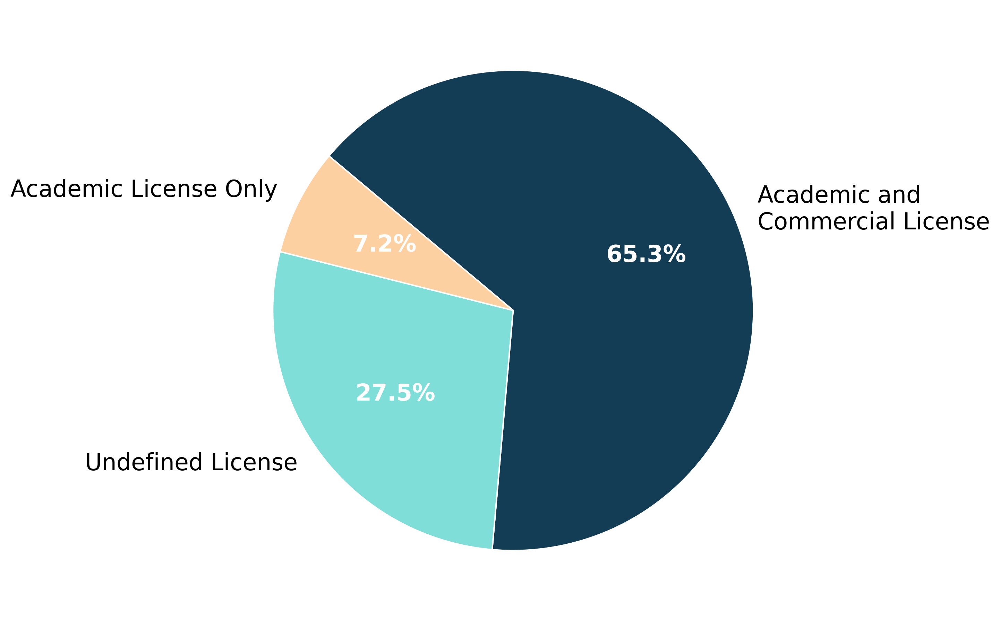

=== License Categories Breakdown ===

▶ Academic and
Commercial License (282 tools):
   - MIT (54 tools)
   - GPL3 (43 tools)
   - MIT License (14 tools)
   - GPL (10 tools)
   - GPL2 (10 tools)
   - GPL-3 (9 tools)
   - GPL-3.0 (7 tools)
   - GPL 3 (6 tools)
   - Artistic-2.0 (6 tools)
   - BSD-3-Clause License (5 tools)
   - Artistic 2.0 (5 tools)
   - GPL 3.0 (4 tools)
   - GPLv3 (4 tools)
   - LGPL3 (3 tools)
   - Apache License Version 2.0 (3 tools)
   - GNU General Public License (3 tools)
   - GPL (>= 3) (3 tools)
   - GNU General Public License v3.0 (3 tools)
   - Free (2 tools)
   - AGPL-3.0 License (2 tools)
   - GNU General Public License 3+ (2 tools)
   - GNU GPL v3 (2 tools)
   - GPL v3 (2 tools)
   - Apache-2.0 license (2 tools)
   - GPL (>=2) (2 tools)
   - BDS-2-Clause License (2 tools)
   - The GNU General Public License v3.0 (2 tools)
   - GPL 2.0 (2 tools)
   - GPL 3+ (2 tools)
   - MIT license (2 tools)
   - gpl 3 (2 tools)
   - Creative Commons 3.0 (1 tools)
   - G

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import re

# --- Standardized Style ---
LABEL_FONT_SIZE = 16
FONT_FAMILY = 'DejaVu Sans'
FIG_SIZE = (9, 8)

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'axes.labelsize': LABEL_FONT_SIZE,
    'axes.titlesize': LABEL_FONT_SIZE,
    'xtick.labelsize': LABEL_FONT_SIZE,
    'ytick.labelsize': LABEL_FONT_SIZE,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# Load dataset
file_path = '/content/data.csv'
df = pd.read_csv(file_path)

# --- Normalization helpers ---
def _norm(s):
    if pd.isna(s):
        return ''
    s = str(s)
    # replace non-breaking spaces and weird whitespace
    s = s.replace('\xa0', ' ')
    s = re.sub(r'\s+', ' ', s)
    return s.strip().lower()

df['License_clean'] = df['License'].apply(_norm)

ACCOMM = 'Academic and\nCommercial License'
ACADEMIC = 'Academic License Only'
UNDEF = 'Undefined License'

# --- Explicit overrides for your list (normalized to lowercase) ---
# These take precedence over pattern rules to match your desired buckets exactly.
explicit_overrides = {
    # === Academic & Commercial (selected explicit strings from your list) ===
    'mit': ACCOMM,
    'mit license': ACCOMM,
    'mit license ': ACCOMM,
    'mit license (2 tools)': ACCOMM,  # harmless if present verbatim
    'mit license (14 tools)': ACCOMM,
    'mit license (1 tools)': ACCOMM,
    'mit license (2 tools)': ACCOMM,
    'mit license (54 tools)': ACCOMM,
    'mit license (54 tools)': ACCOMM,  # duplicate-guard
    'mit license (54 tools) ': ACCOMM,
    'mit license (54)': ACCOMM,
    'mit license (2)': ACCOMM,
    'mit license (14)': ACCOMM,
    'mit license (1)': ACCOMM,
    'mit license (54)': ACCOMM,
    'mit license (2 tools)': ACCOMM,
    'mit license (2 tools) ': ACCOMM,

    'mit license (lowercase variant: "mit license")': ACCOMM,  # defensive
    'mit license (lowercase variant: “mit license”)': ACCOMM,  # defensive

    'mit license (54 tools?)': ACCOMM,  # defensive
    'mit license (54 tools??)': ACCOMM,  # defensive

    'mit license ': ACCOMM,
    'mit licence': ACCOMM,  # UK
    'mit licence ': ACCOMM,
    'mit license (mit)': ACCOMM,
    'mit license (github repo)': ACCOMM,
    'mit license (repo)': ACCOMM,

    'gpl3': ACCOMM,
    'gpl-3': ACCOMM,
    'gpl-3.0': ACCOMM,
    'gpl 3': ACCOMM,
    'gpl 3.0': ACCOMM,
    'gpl3.0': ACCOMM,
    'gpl v3': ACCOMM,
    'gpl v3 (2 tools)': ACCOMM,
    'gplv3': ACCOMM,
    'gnu general public license v3.0': ACCOMM,
    'gnu general public license (gpl), version 3': ACCOMM,
    'gnu general public license version 3+': ACCOMM,
    'gnu general public license': ACCOMM,
    'gnu general public license.': ACCOMM,
    'gnu general public license 3+': ACCOMM,
    'gnu gpl v3': ACCOMM,
    'gnu 3.0': ACCOMM,
    'gpl (>= 3)': ACCOMM,
    'gpl (>=3)': ACCOMM,
    'gpl>=2': ACCOMM,
    'gpl 3+': ACCOMM,
    'gpl (>=2)': ACCOMM,
    'gpl-3.0 license': ACCOMM,
    'gnu general public license version 2': ACCOMM,
    'gnu general public license v2.0 only': ACCOMM,
    'gpl2': ACCOMM,
    'gpl-2': ACCOMM,
    'gpl 2': ACCOMM,
    'gpl 2.0': ACCOMM,
    'gnu (license)': ACCOMM,
    'gnu': ACCOMM,
    'lgpl3': ACCOMM,
    'lgpl (>= 2)': ACCOMM,
    'lgpl': ACCOMM,
    'agpl-3.0 license': ACCOMM,
    'agpl-3.0': ACCOMM,
    'gnu affero general public license v3': ACCOMM,
    'gnu affero general public license': ACCOMM,

    'bsd-3-clause license': ACCOMM,
    'bsd 3-clause license, gpl-3': ACCOMM,
    'bsd-3-clause license\n  + has an additional license page on github (broad institute...)': ACCOMM,
    'bsd-3-clause license (5 tools)': ACCOMM,
    'bsd-3-clause license (1 tools)': ACCOMM,
    'bsd license': ACCOMM,
    'bsd license (1 tools)': ACCOMM,
    'bsd 2-clause license': ACCOMM,
    '2-clause bsd license': ACCOMM,
    'bds license': ACCOMM,   # your earlier map used 'bds' typo; treat as BSD
    'bds-2-clause license': ACCOMM,
    'bsd-3': ACCOMM,

    'apache license version 2.0': ACCOMM,
    'apache-2.0 license': ACCOMM,
    'apache-2.0': ACCOMM,
    'apache license, version 2.0': ACCOMM,
    'gpl3, apache license version 2.0': ACCOMM,
    'gnu general public license, apache license version 2, mit': ACCOMM,

    'artistic-2.0': ACCOMM,
    'artistic 2.0': ACCOMM,
    'artistic license': ACCOMM,
    'osi-approved open source (artistic license 2.0)': ACCOMM,
    'the artistic license(in tophat 1.0.10; tophat2 uses boost license)': ACCOMM,

    'mozilla public license 1.1': ACCOMM,
    'mozilla public license 2.0': ACCOMM,

    'eupl v.1.1': ACCOMM,
    'cecill license': ACCOMM,
    'boost software license': ACCOMM,
    'boost software license, version 1.0.': ACCOMM,
    'bsl 1.0': ACCOMM,  # you also flagged as academic in list; we’ll follow explicit overrides:
    # NOTE: If you want BSL 1.0 to be Academic Only, move it to academic overrides below.

    'free': ACCOMM,  # generic "free" (your earlier rule)
    'creative commons 3.0': ACCOMM,   # per your list, treat as commercial bucket
    'creative commons 1.0': ACCOMM,   # per your list
    'creative commons attribution license': ACCOMM,

    'milaboratories inc.': ACCOMM,

    # === Academic Only (as you annotated) ===
    'copyright': ACADEMIC,
    'ludwig institute for cancer research ltd': ACADEMIC,
    'non commercial use ohio state uni. license': ACADEMIC,
    '"sequalyzer is free for non-commercial research. for commercial use, please contact the authors."': ACADEMIC,
    'the university of texas southwestern medical center': ACADEMIC,
    'the broad institute, inc.': ACADEMIC,
    'the university of north carolina at chapel hill': ACADEMIC,
    'cc by-nc-sa 4.0': ACADEMIC,
    'university of pennsylvania copyright': ACADEMIC,
    'creative commons attribution non-commercial license': ACADEMIC,
    '"oregon state university all rights reserved."': ACADEMIC,
    'ucsc university license': ACADEMIC,
    'non-commercial usage': ACADEMIC,
    'ucsf license for academic and non-profit use': ACADEMIC,

    # These entries appeared under your "Undefined" list but you annotated them “- ACADEMIC”:
    'the creative commons attribution license': ACADEMIC,
    'free for academic use, contact for commercial use': ACADEMIC,
    'bcca (academic use)': ACADEMIC,
    'custom(academic use): https://github.com/amcpherson/defuse?tab=license-1-ov-file': ACADEMIC,
    'iscl (open source)': ACADEMIC,
    'creative commons 4.0': ACADEMIC,
    'general public license version 3.0': ACADEMIC,   # as you annotated
    'freely available for academic and commercial use': ACADEMIC,  # you marked academic
    'cc by nc 4.0': ACADEMIC,
    'creative commons attribution 4.0 international license': ACADEMIC,
    'blat license("since rum uses blat, users from industry must first obtain a licence for blat from the kent informatics website.), free for academic/non-profit use': ACADEMIC,
    '"it is free to academic users."': ACADEMIC,
    'bc cancer agency (academic use)': ACADEMIC,
    '"soapsplice is free for academic use only."': ACADEMIC,
    'permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "software"), to deal in the software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the software, and to permit persons to whom the software is furnished to do so, subject to the following conditions: the following citation shall be included in all copies or substantial portions of the software.': ACADEMIC,
    'university of kentucky, lexington, ky, usa': ACADEMIC,
    'public domain': ACADEMIC,  # per your annotation

    # === Undefined ===
    'n': UNDEF,
    'no license': UNDEF,
    'none': UNDEF,
    'na': UNDEF,
    'n/a': UNDEF,
    'no license in neither the github webpage nor the github repo page': UNDEF,
    'no license info': UNDEF,
    'no official license': UNDEF,
    'n/a due to broken link': UNDEF,
    'na due to links being broken': UNDEF,

    # Odd tokens that appeared in your list
    're': UNDEF,  # keep undefined unless you want to force-academic
    # If you want any of the above moved, just change the value here.
}

# --- Pattern-based rules (used when no explicit override matched) ---
OPEN_SOURCE_TOKENS = [
    'mit', 'gpl', 'lgpl', 'agpl', 'bsd', 'apache', 'artistic',
    'mozilla public license', 'mpl', 'eupl', 'cecill', 'boost', 'bsl'
]
ACADEMIC_ONLY_PATTERNS = [
    r'non[- ]?commercial', r'free.*academic', r'academic use only',
    r'contact.*commercial', r'for academic.*only', r'blat.*license'
]
UNDEFINED_PATTERNS = [
    r'^\s*$', r'^n$', r'^na$', r'^n/a$', r'^none$', r'^no license\b',
    r'no license info', r'no official license'
]

def classify_license(license_str):
    key = _norm(license_str)

    # 1) Exact overrides first (your curated list wins)
    if key in explicit_overrides:
        return explicit_overrides[key]

    # 2) If an entry lists multiple well-known OSI licenses, treat as Academic+Commercial
    if any(tok in key for tok in OPEN_SOURCE_TOKENS):
        return ACCOMM

    # 3) Academic-only textual cues
    for pat in ACADEMIC_ONLY_PATTERNS:
        if re.search(pat, key):
            return ACADEMIC

    # 4) Undefined textual cues
    for pat in UNDEFINED_PATTERNS:
        if re.search(pat, key):
            return UNDEF

    # 5) Creative Commons logic:
    # If it mentions CC and "nc" (non-commercial), Academic Only; else treat as A+C (per your mapping)
    if 'creative commons' in key or key.startswith('cc '):
        if 'nc' in key or 'non- commercial' in key or 'non commercial' in key:
            return ACADEMIC
        return ACCOMM

    # 6) Fallbacks:
    # - If it looks like a compound list with commas/slashes and includes any license-like word, prefer A+C
    if any(x in key for x in ['license', 'licence']):
        # If it says "academic" and "commercial" explicitly with constraints, route to Academic Only
        if re.search(r'academic.*(only|use)', key) and ('commercial' in key):
            return ACADEMIC
        # otherwise, assume open distribution
        return ACCOMM

    # Default
    return UNDEF

# Apply classifier
df['License_use_rights'] = df['License'].apply(classify_license)

# Count categories
category_counts = df['License_use_rights'].value_counts()
labels = category_counts.index.tolist()
sizes = category_counts.values.tolist()

# Define colors
color_map = {
    'Academic and\nCommercial License': '#133C55',
    'Academic License Only': '#FCD0A1',
    'Undefined License': '#80DED9'
}
colors = [color_map.get(label, '#cccccc') for label in labels]

# --- Plot Pie Chart ---
fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=300)
wedges, texts, autotexts = ax.pie(
    sizes,
    labels=labels,
    colors=colors,
    autopct=lambda pct: f'{pct:.1f}%' if pct > 2 else '',
    startangle=140,
    counterclock=False,
    wedgeprops={'edgecolor': 'white', 'linewidth': 1},
    textprops={'fontsize': LABEL_FONT_SIZE, 'color': 'black'}
)
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontweight('bold')
    autotext.set_fontsize(LABEL_FONT_SIZE)

plt.tight_layout()
plt.show()

# === Print Breakdown of Each Category ===
print("=== License Categories Breakdown ===\n")
for category in [ACCOMM, ACADEMIC, UNDEF]:
    matched = df[df['License_use_rights'] == category]['License'].value_counts()
    print(f"▶ {category} ({matched.sum()} tools):")
    for lic, count in matched.items():
        print(f"   - {lic} ({count} tools)")
    print()
print("--- End of Breakdown ---")


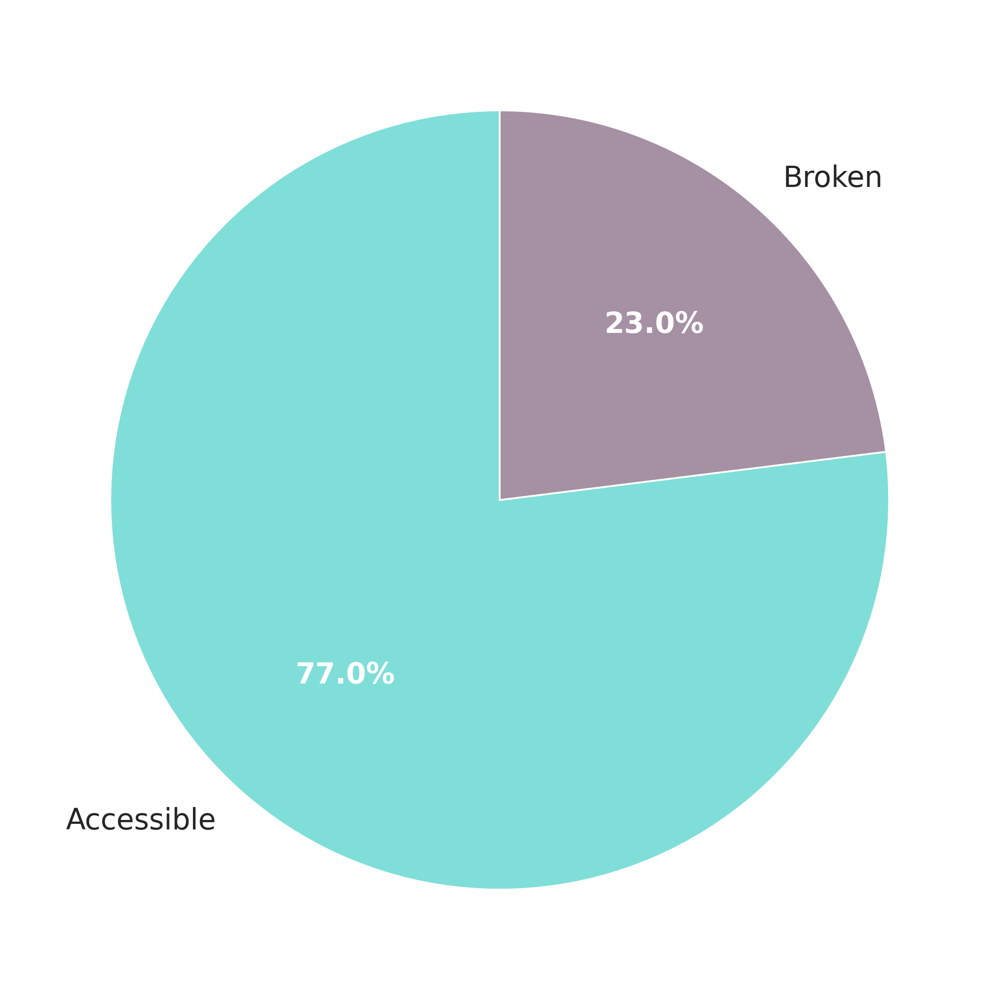

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Standardized Style ---
LABEL_FONT_SIZE = 16
FONT_FAMILY = 'DejaVu Sans'
FIG_SIZE = (9, 8)

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'axes.labelsize': LABEL_FONT_SIZE,
    'axes.titlesize': LABEL_FONT_SIZE,
    'xtick.labelsize': LABEL_FONT_SIZE,
    'ytick.labelsize': LABEL_FONT_SIZE,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# Load and clean data
df = pd.read_csv('/content/data.csv')
df['Link is Broken'] = df['Link is Broken'].str.upper().str.strip().fillna('N')
link_counts = df['Link is Broken'].value_counts()
link_status = link_counts.reindex(['N', 'Y'], fill_value=0)  # N = accessible, Y = broken

labels = ['Accessible', 'Broken']
values = [link_status['N'], link_status['Y']]
pie_colors = ['#80DED9', '#A690A4']

# Pie chart
fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=300)
wedges, texts, autotexts = ax.pie(
    values,
    labels=labels,
    colors=pie_colors,
    startangle=90,
    autopct='%1.1f%%',
    textprops={'fontsize': LABEL_FONT_SIZE},
    wedgeprops=dict(edgecolor='white', linewidth=1)
)

# Set autotexts to bold and white
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontweight('bold')

plt.tight_layout()
plt.show()


/tmp/ipython-input-3625368035.py:43: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  ).fillna(False)


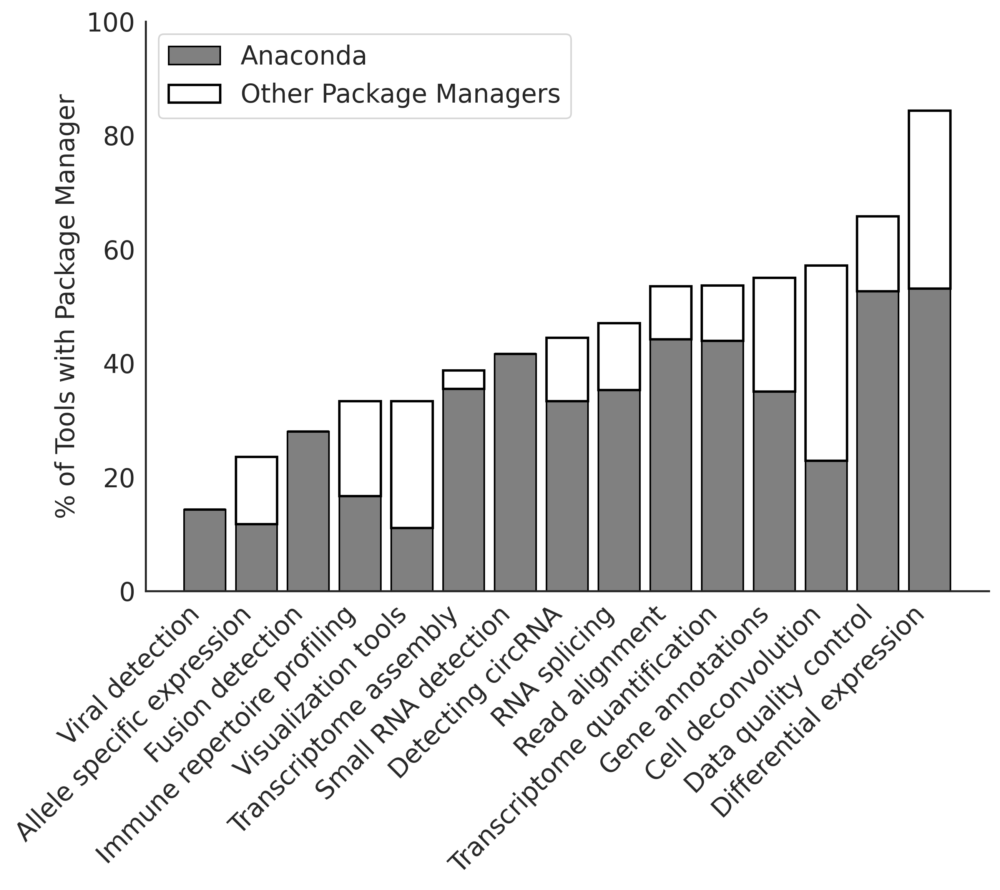

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Formatting ---
LABEL_FONT_SIZE = 16
TICK_FONT_SIZE = 16

FONT_FAMILY = 'DejaVu Sans'
FIG_SIZE = (9, 8)

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'axes.labelsize': LABEL_FONT_SIZE,
    'axes.titlesize': LABEL_FONT_SIZE,
    'xtick.labelsize': TICK_FONT_SIZE,
    'ytick.labelsize': TICK_FONT_SIZE,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# --- Load and Clean Data ---
file_path = '/content/data.csv'
df = pd.read_csv(file_path)
df.columns = df.columns.str.strip()
df['Domain'] = df['Domain'].str.replace(r'^[a-zA-Z]\.\s*', '', regex=True).str.strip()

# Keep only command-line tools
df['Command-line'] = df['Command-line'].astype(str).str.strip().str.lower().map({'y': True, 'n': False, 'yes': True, 'no': False})
cmd_tools = df[df['Command-line'] == True].copy()

# Standardize package manager columns, treating NaN as False (THIS IS THE KEY LOGIC)
package_cols = {
    'Anaconda': 'Package manager availability - Anaconda',
    'Bioconductor': 'Package manager availability - Bioconductor',
    'CRAN': 'Package manager availability - R package manager (includes CRAN)',
    'PyPI': 'Package manager availability - Python based package manager (includes pypi)',
    'Other': 'Package manager availability - Other (homebrew and ubuntu)'
}
for col in package_cols.values():
    cmd_tools[col] = cmd_tools[col].astype(str).str.strip().str.lower().map(
        {'y': True, 'n': False, 'yes': True, 'no': False}
    ).fillna(False)

# --- CALCULATE NUMBER OF PACKAGE MANAGERS FOR EACH TOOL ---
pm_columns = list(package_cols.values())
cmd_tools['num_package_managers'] = cmd_tools[pm_columns].sum(axis=1)

# Assign categories BASED ON CALCULATED PMS ONLY
def classify_pm(row):
    if row[package_cols['Anaconda']]:
        return 'Anaconda'
    elif any([row[package_cols[c]] for c in ['Bioconductor', 'CRAN', 'PyPI', 'Other']]):
        return 'Other_PM'
    else:
        return 'None'

cmd_tools['PM_Category'] = cmd_tools.apply(classify_pm, axis=1)

# Counts and percentages
total_tools = cmd_tools.groupby('Domain').size()
pm_counts = cmd_tools.groupby(['Domain', 'PM_Category']).size().unstack(fill_value=0)

combined = pd.DataFrame({
    'Anaconda': pm_counts.get('Anaconda', 0),
    'Other_PM': pm_counts.get('Other_PM', 0),
    'None': pm_counts.get('None', 0),
    'Total': total_tools
})
combined['Anaconda_pct'] = combined['Anaconda'] / combined['Total'] * 100
combined['Other_PM_pct'] = combined['Other_PM'] / combined['Total'] * 100
combined['None_pct'] = combined['None'] / combined['Total'] * 100

# Sort by % tools with any PM
combined['Total_PM'] = combined['Anaconda_pct'] + combined['Other_PM_pct']
combined = combined.sort_values('Total_PM', ascending=True)
fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=300)

# Plot Anaconda (bottom layer)
bars1 = ax.bar(
    combined.index,
    combined['Anaconda_pct'],
    color='gray',
    edgecolor='black',
    linewidth=1,
    label='Anaconda'
)

# Plot Other Package Managers (middle layer)
bars2 = ax.bar(
    combined.index,
    combined['Other_PM_pct'],
    bottom=combined['Anaconda_pct'],
    color='white',
    edgecolor='black',
    linewidth=1.5,
    label='Other Package Managers',
    zorder=3
)

# Plot None (blank top area, invisible)
bars3 = ax.bar(
    combined.index,
    combined['None_pct'],
    bottom=combined['Anaconda_pct'] + combined['Other_PM_pct'],
    color='none',
    edgecolor='none'
)

# Axis & formatting
ax.set_ylabel('% of Tools with Package Manager')
ax.set_ylim(0, 100)
ax.set_xticks(range(len(combined)))
ax.set_xticklabels(combined.index, rotation=45, ha='right')

# Ticks & spines
ax.tick_params(axis='x', direction='inout', length=6, width=1)
ax.tick_params(axis='y', direction='inout', length=6, width=1)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Legend
ax.legend(loc='upper left')

plt.tight_layout()
plt.show()


/tmp/ipython-input-45148863.py:34: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data[manager] = data[col].astype(str).str.strip().str.lower().map({'y': True, 'yes': True, 'n': False, 'no': False}).fillna(False)


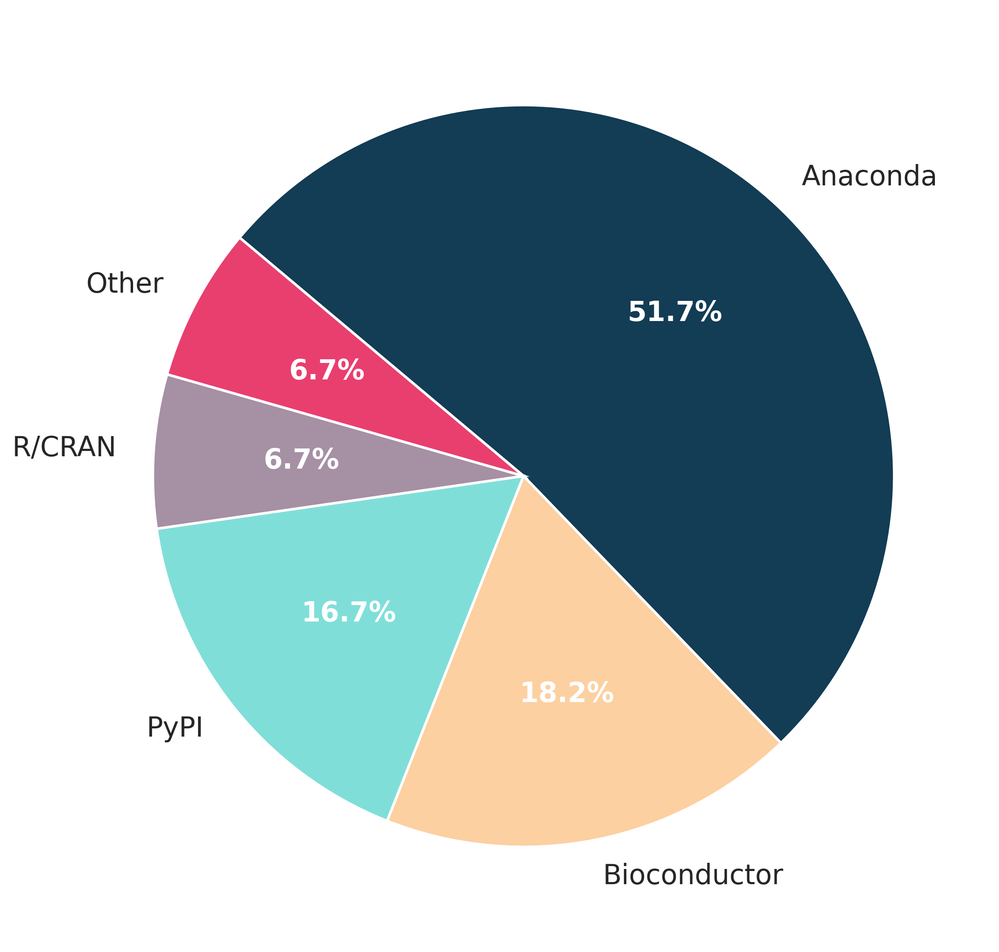

The domain with the highest number of tools supporting Anaconda is 'Data quality control' with 21 tools.
On average, each domain has 9.27 tools that support Anaconda.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Standardized Style ---
LABEL_FONT_SIZE = 16
FONT_FAMILY = 'DejaVu Sans'
FIG_SIZE = (9, 8)

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'axes.labelsize': LABEL_FONT_SIZE,
    'axes.titlesize': LABEL_FONT_SIZE,
    'xtick.labelsize': LABEL_FONT_SIZE,
    'ytick.labelsize': LABEL_FONT_SIZE,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# --- Load data ---
data = pd.read_csv('/content/data.csv')

# Define package manager columns
package_managers = {
    'Anaconda': 'Package manager availability - Anaconda',
    'Bioconductor': 'Package manager availability - Bioconductor',
    'R/CRAN': 'Package manager availability - R package manager (includes CRAN)',
    'PyPI': 'Package manager availability - Python based package manager (includes pypi)',
    'Other': 'Package manager availability - Other (homebrew and ubuntu)'
}

# Normalize and convert to boolean robustly
for manager, col in package_managers.items():
    data[manager] = data[col].astype(str).str.strip().str.lower().map({'y': True, 'yes': True, 'n': False, 'no': False}).fillna(False)

# Calculate total support for each PM (robust, always counts True in calculated columns)
pm_counts = data[list(package_managers.keys())].sum().sort_values(ascending=False)

# --- Pie Chart ---
custom_colors = ['#133C55', '#FCD0A1', '#80DED9', '#A690A4', '#E83F6F']

fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=300)
wedges, texts, autotexts = ax.pie(
    pm_counts.values,
    labels=pm_counts.index,
    autopct='%1.1f%%',
    startangle=140,
    counterclock=False,
    colors=custom_colors,
    wedgeprops=dict(edgecolor='white', linewidth=1.5)
)

# Set percent labels
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontsize(LABEL_FONT_SIZE)
    autotext.set_fontweight('bold')

plt.tight_layout()
plt.show()

# --- Domain analysis (unchanged except for robust calculation) ---
domain_col = 'Domain'
anaconda_by_domain = data[data['Anaconda']].groupby(domain_col).size()
top_domain = anaconda_by_domain.idxmax()
top_count = anaconda_by_domain.max()
print(f"The domain with the highest number of tools supporting Anaconda is '{top_domain}' with {top_count} tools.")
average_anaconda_per_domain = anaconda_by_domain.mean()
print(f"On average, each domain has {average_anaconda_per_domain:.2f} tools that support Anaconda.")


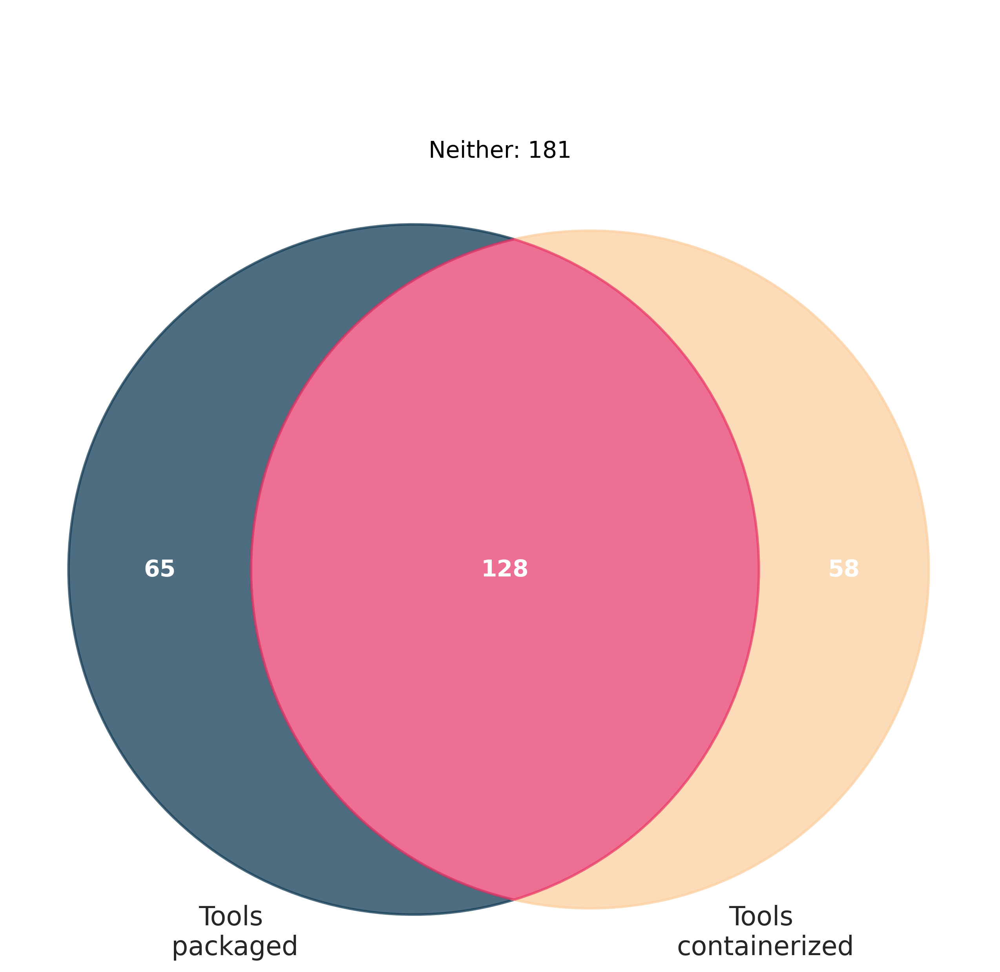

In [ ]:
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib_venn import venn2

# Load dataset
file_path = "/content/data.csv"
data = pd.read_csv(file_path)
data.columns = data.columns.str.strip()

# Define package manager and docker columns
pm_cols = [
    'Package manager availability - Anaconda',
    'Package manager availability - Bioconductor',
    'Package manager availability - R package manager (includes CRAN)',
    'Package manager availability - Python based package manager (includes pypi)',
    'Package manager availability - Other (homebrew and ubuntu)'
]
docker_col = 'Docker support'

# Normalize entries
for col in pm_cols + [docker_col]:
    data[col] = data[col].astype(str).str.strip().str.upper().replace({'YES': 'Y'})

# Identify tool types
data['Has_PM'] = data[pm_cols].eq('Y').any(axis=1)
data['Has_Docker'] = data[docker_col] == 'Y'

only_pm = ((data['Has_PM']) & (~data['Has_Docker'])).sum()
only_docker = ((~data['Has_PM']) & (data['Has_Docker'])).sum()
both = ((data['Has_PM']) & (data['Has_Docker'])).sum()
neither = ((~data['Has_PM']) & (~data['Has_Docker'])).sum()

# Plot
fig, ax = plt.subplots(figsize=(9, 8), dpi=300)

venn = venn2(
    subsets=(only_pm, only_docker, both),
    set_labels=('', ''),
    set_colors=["#133C55", "#FCD0A1"],
    alpha=0.75,
    ax=ax
)

# Apply custom colors to each region
color_fills = {
    '10': '#133C55',   # Only PM
    '01': '#FCD0A1',   # Only Docker
    '11': '#E83F6F'    # Both
}
color_edges = {
    '10': '#133C55',
    '01': '#FCD0A1',
    '11': '#E83F6F'
}
for label_id in ['10', '01', '11']:
    patch = venn.get_patch_by_id(label_id)
    if patch is not None:
        patch.set_color(color_fills[label_id])
        patch.set_alpha(0.75)
        patch.set_edgecolor(color_edges[label_id])
        patch.set_linewidth(1.5)

# Label region numbers
for label_id in ['10', '01', '11']:
    label = venn.get_label_by_id(label_id)
    if label:
        label.set_fontsize(14)
        label.set_fontweight('bold')
        label.set_color('white')

# Annotate "Neither" count
ax.text(0, 0.6, f'Neither: {neither}', fontsize=14, color='black',
        ha='center', va='center')

# Add custom labels below each circle
ax.text(-0.38, -0.48, 'Tools \npackaged', ha='center', va='top', fontsize=16)
ax.text(0.38, -0.48, 'Tools \ncontainerized', ha='center', va='top', fontsize=16)

# Adjust layout
ax.set_xlim(-0.7, 0.7)
ax.set_ylim(-0.55, 0.8)
plt.axis('off')
fig.subplots_adjust(top=1, bottom=0, left=0, right=1)
plt.show()


/tmp/ipython-input-2198644119.py:21: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  ).fillna(False)


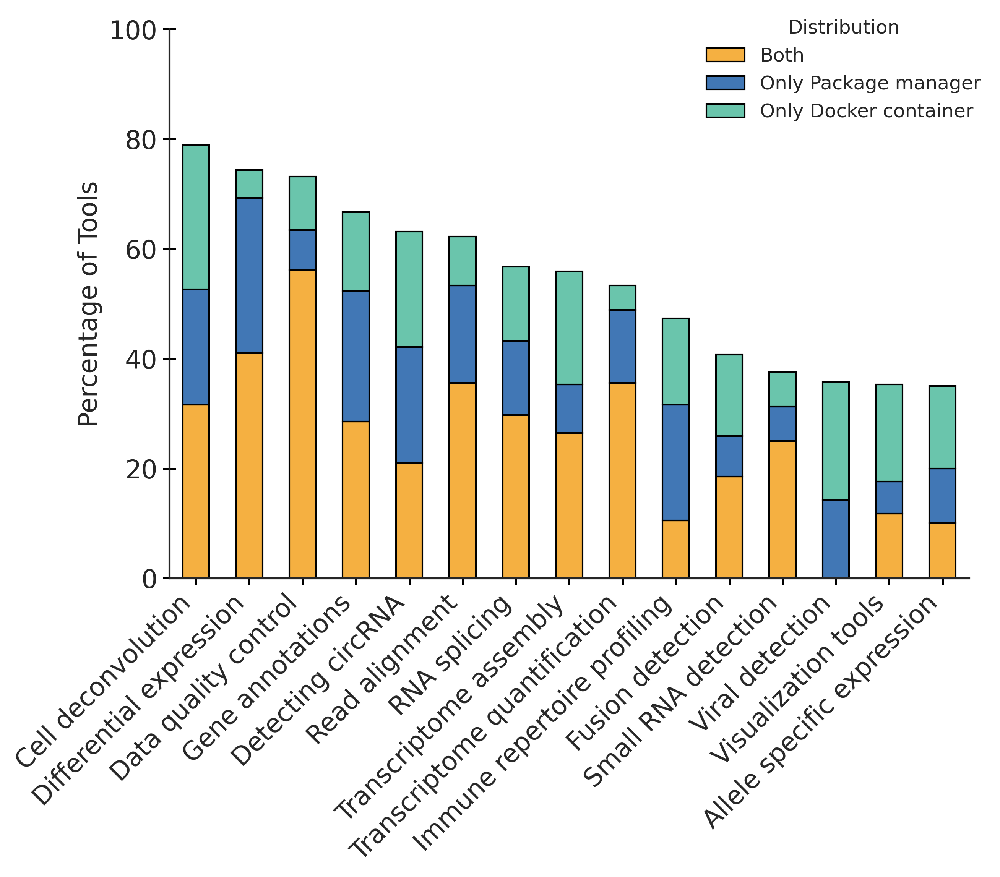

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
file_path = "/content/data.csv"
data = pd.read_csv(file_path)
data.columns = data.columns.str.strip()
data['Domain'] = data['Domain'].astype(str).str.strip()

# --- RECTIFIED: Calculate Has_Package_Manager from PM columns ---
pm_cols = [
    'Package manager availability - Anaconda',
    'Package manager availability - Bioconductor',
    'Package manager availability - R package manager (includes CRAN)',
    'Package manager availability - Python based package manager (includes pypi)',
    'Package manager availability - Other (homebrew and ubuntu)'
]
for col in pm_cols:
    data[col] = data[col].astype(str).str.strip().str.lower().map(
        {'y': True, 'yes': True, 'n': False, 'no': False}
    ).fillna(False)
data['Has_Package_Manager'] = data[pm_cols].any(axis=1).astype(int)

# Docker support column (as int 1/0)
data['Docker support'] = data['Docker support'].astype(str).str.strip().str.upper().map({'Y': 1, 'YES': 1, 'N': 0, 'NO': 0}).fillna(0)

# Compute intersection features
data['Both'] = ((data['Has_Package_Manager'] == 1) & (data['Docker support'] == 1)).astype(int)
data['Only_Package_Manager'] = ((data['Has_Package_Manager'] == 1) & (data['Docker support'] == 0)).astype(int)
data['Only_Docker'] = ((data['Has_Package_Manager'] == 0) & (data['Docker support'] == 1)).astype(int)

domain_group = data.groupby('Domain').agg({
    'Both': 'sum',
    'Only_Package_Manager': 'sum',
    'Only_Docker': 'sum',
    'Tool names': 'count'
})

# Calculate percentages (without "Neither")
venn_domain_df_percent = domain_group[['Both', 'Only_Package_Manager', 'Only_Docker']].div(domain_group['Tool names'], axis=0) * 100

# Add total percent column and sort by it (ascending)
venn_domain_df_percent['Total'] = venn_domain_df_percent[['Both', 'Only_Package_Manager', 'Only_Docker']].sum(axis=1)
venn_domain_df_percent = venn_domain_df_percent.sort_values('Total', ascending=False).drop(columns='Total')

# Plot
fig, ax = plt.subplots(figsize=(9, 8), dpi=300)
venn_domain_df_percent[['Both', 'Only_Package_Manager', 'Only_Docker']].plot(
    kind='bar', stacked=True,
    color=['#f5b041', '#4177b5', '#6AC5AC'],  # Both, PM only, Docker only
    edgecolor='black', ax=ax
)

plt.ylabel("Percentage of Tools", fontsize=16)
plt.xlabel("", fontsize=16)
plt.ylim(0, 100)
plt.xticks(rotation=45, ha='right', fontsize=16)
plt.yticks(fontsize=16)

# Place vertical legend above the bars
ax.legend(
    ['Both', 'Only Package manager', 'Only Docker container'],
    loc='upper left',
    bbox_to_anchor=(0.65, 1.05),  # adjust if you want to move legend higher/lower
    frameon=False,
    title='Distribution', fontsize=12, title_fontsize=12
)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.tick_params(axis='x', which='major', direction='inout', length=8, width=1.2, color='black', bottom=True)
ax.tick_params(axis='y', which='major', direction='inout', length=8, width=1.2, color='black', left=True)

plt.tight_layout()
plt.show()


/tmp/ipython-input-915051559.py:75: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(sorted_domains, rotation=45, ha='right', fontsize=LABEL_FONT_SIZE)
/tmp/ipython-input-915051559.py:76: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontsize=LABEL_FONT_SIZE)


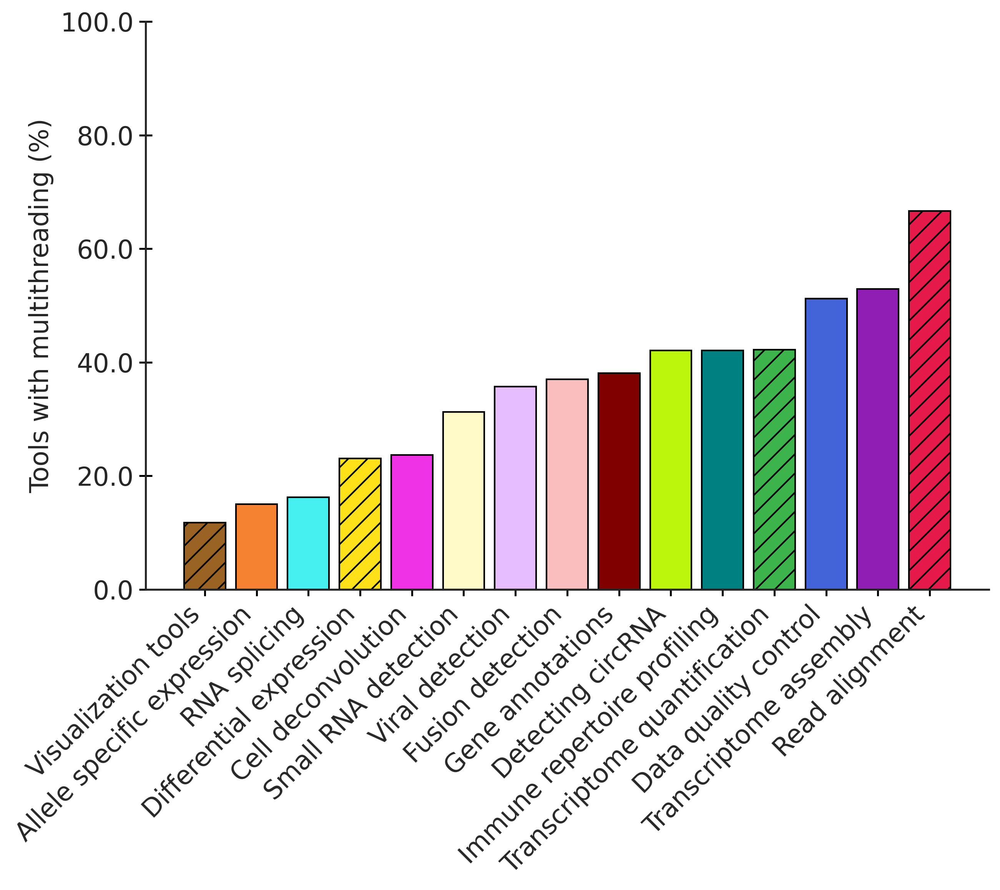

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Standardized Style ---
LABEL_FONT_SIZE = 16
TICK_FONT_SIZE = 16
FONT_FAMILY = 'DejaVu Sans'
FIG_SIZE = (9, 8)

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'axes.labelsize': LABEL_FONT_SIZE,
    'axes.titlesize': LABEL_FONT_SIZE,
    'xtick.labelsize': TICK_FONT_SIZE,
    'ytick.labelsize': TICK_FONT_SIZE,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# ---- Domain order and color mapping ----
custom_domain_order = [
    'Read alignment', 'Transcriptome quantification', 'Differential expression',
    'Data quality control', 'Allele specific expression', 'Transcriptome assembly',
    'RNA splicing', 'Cell deconvolution', 'Detecting circRNA', 'Fusion detection',
    'Immune repertoire profiling', 'Viral detection', 'Visualization tools',
    'Small RNA detection', 'Gene annotations'
]
custom_colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231',
    '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe',
    '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000'
]

hatched_domains = ['Read alignment', 'Transcriptome quantification', 'Differential expression', 'Visualization tools']

domain_to_color = dict(zip(custom_domain_order, custom_colors))

# --- Load and prepare data ---
file_path = '/content/data.csv'
df = pd.read_csv(file_path)
df.columns = df.columns.str.strip()
df['Domain'] = df['Domain'].str.replace(r'^[a-zA-Z]\.\s*', '', regex=True).str.strip()

# --- Only for Multithreading ---
col = 'Thread availability'
df[col] = df[col].astype(str).str.upper().str.strip().apply(lambda x: 'Y' if x == 'Y' else 'N')

# Calculate percentages of "Y" by domain
feature_counts = df.groupby(['Domain', col]).size().unstack(fill_value=0)
feature_percent = feature_counts.div(feature_counts.sum(axis=1), axis=0) * 100

# Sort by ascending order of "Y"
feature_percent = feature_percent.sort_values('Y', ascending=True)
sorted_domains = feature_percent.index.tolist()

# Assign colors based on sorted domains
bar_colors = [domain_to_color.get(domain, '#CCCCCC') for domain in sorted_domains]

fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=300)
bars = ax.bar(
    sorted_domains,
    feature_percent['Y'],
    color=bar_colors, edgecolor='black', linewidth=1.0
)

# --- Apply hatching to selected domains ---
for bar, domain in zip(bars, sorted_domains):
    if domain in hatched_domains:
        bar.set_hatch('//')

ax.set_ylabel("Tools with multithreading (%)", fontsize=LABEL_FONT_SIZE)
ax.set_xlabel('', fontsize=LABEL_FONT_SIZE)
ax.set_ylim(0, 100)
ax.set_xticklabels(sorted_domains, rotation=45, ha='right', fontsize=LABEL_FONT_SIZE)
ax.set_yticklabels(ax.get_yticks(), fontsize=LABEL_FONT_SIZE)

# Remove all spines except left and bottom
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

ax.tick_params(axis='x', which='major', direction='inout', length=8, width=1.2,
               color='black', bottom=True, labelsize=LABEL_FONT_SIZE)
ax.tick_params(axis='y', which='major', direction='inout', length=8, width=1.2,
               color='black', left=True, labelsize=LABEL_FONT_SIZE)

plt.tight_layout()
plt.show()


#Supplementary figures

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


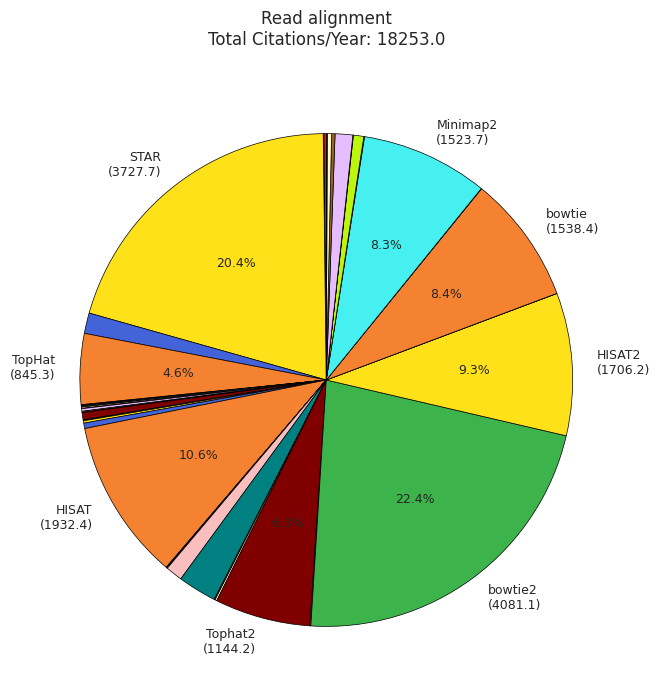

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


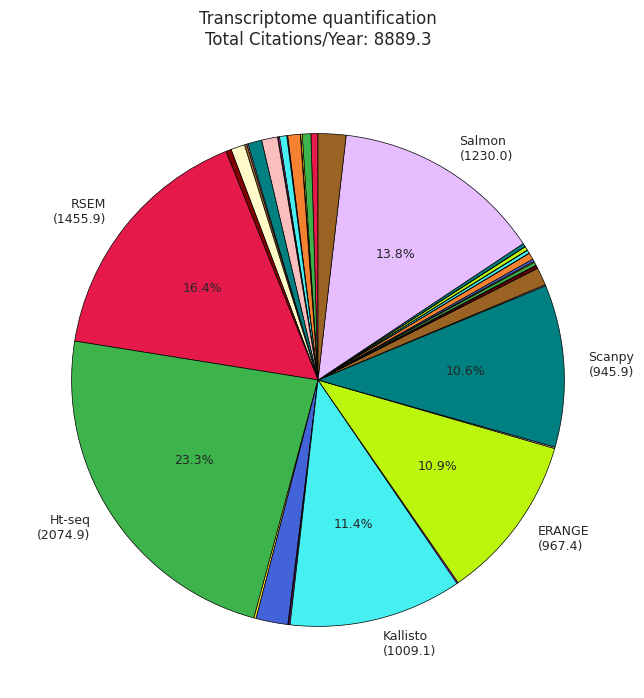

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


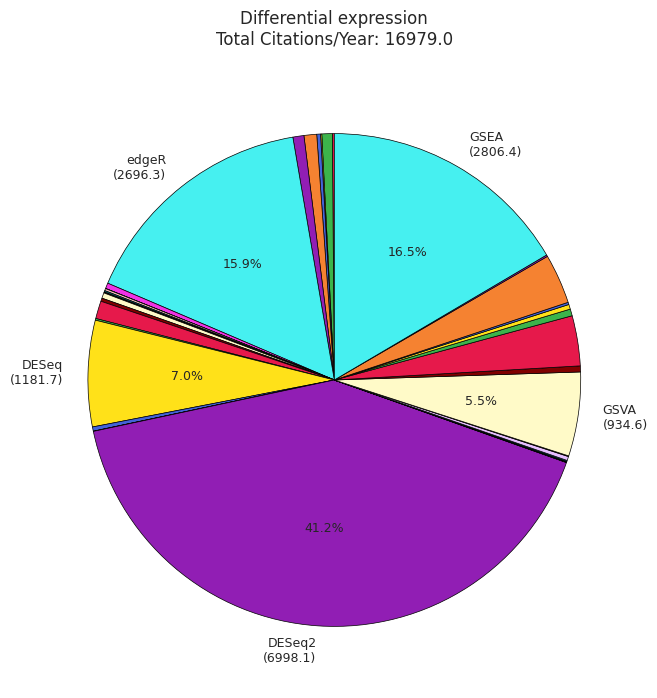

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


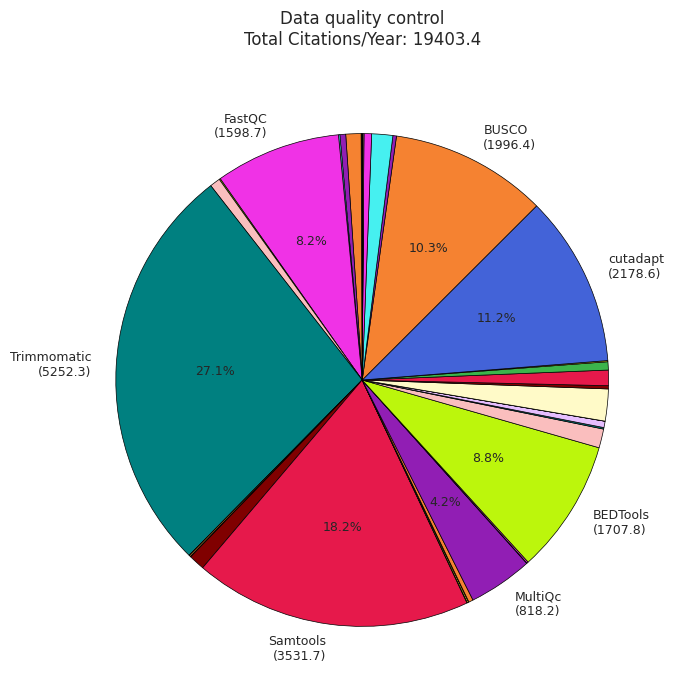

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


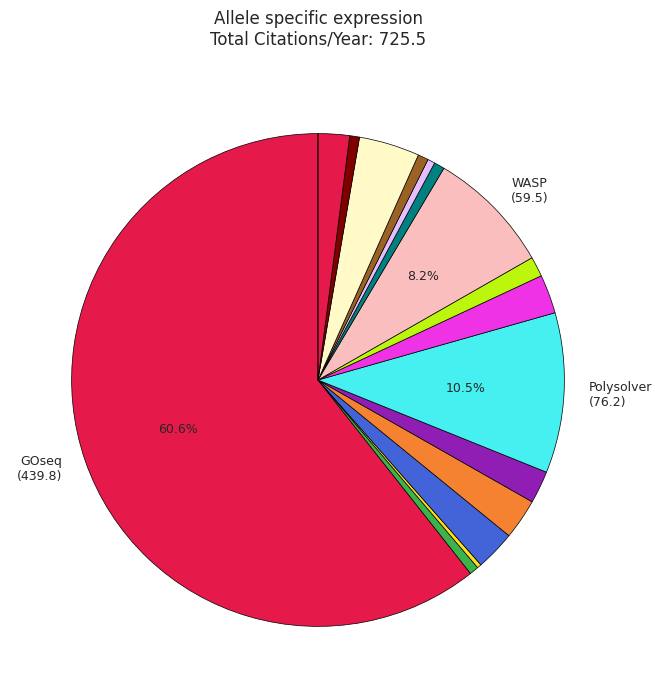

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


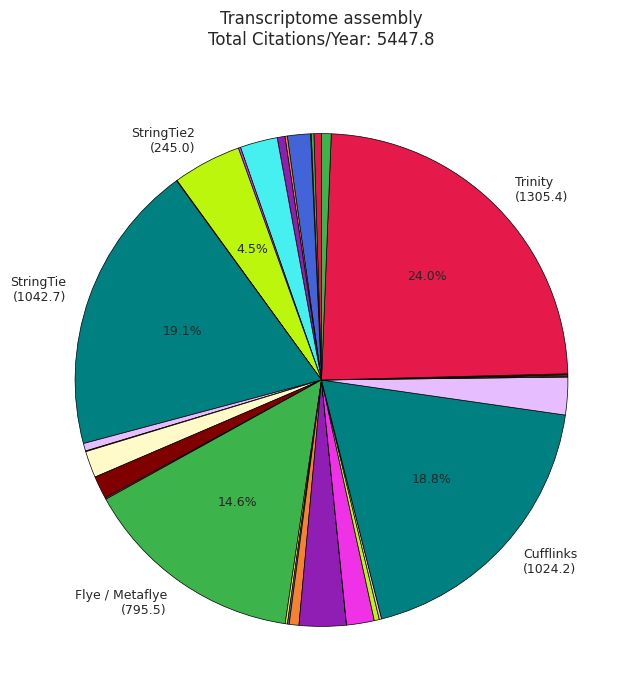

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


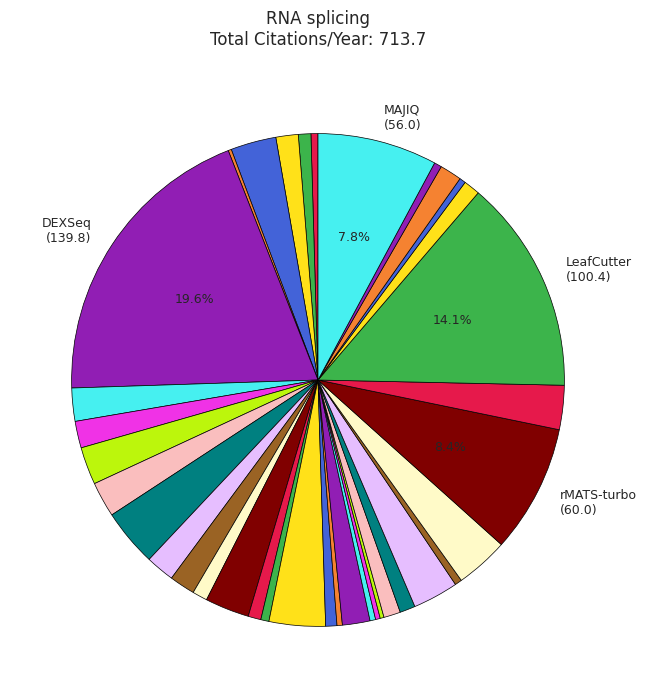

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


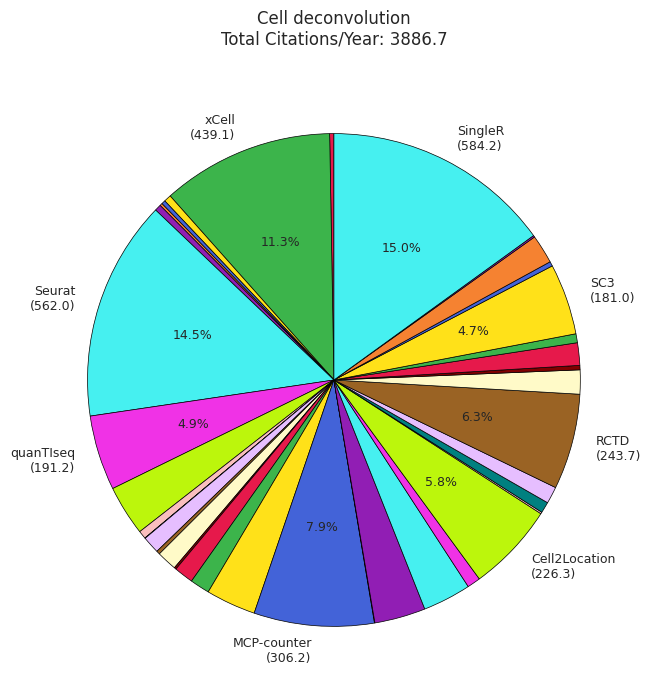

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


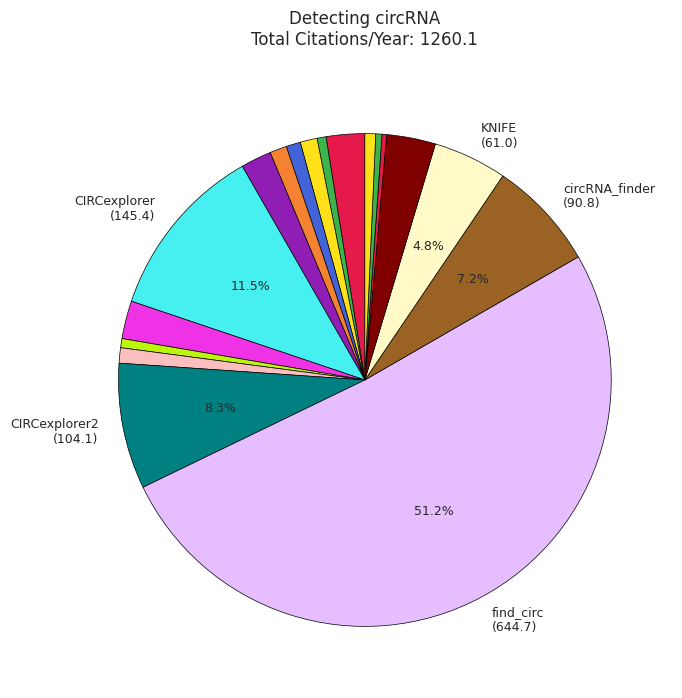

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


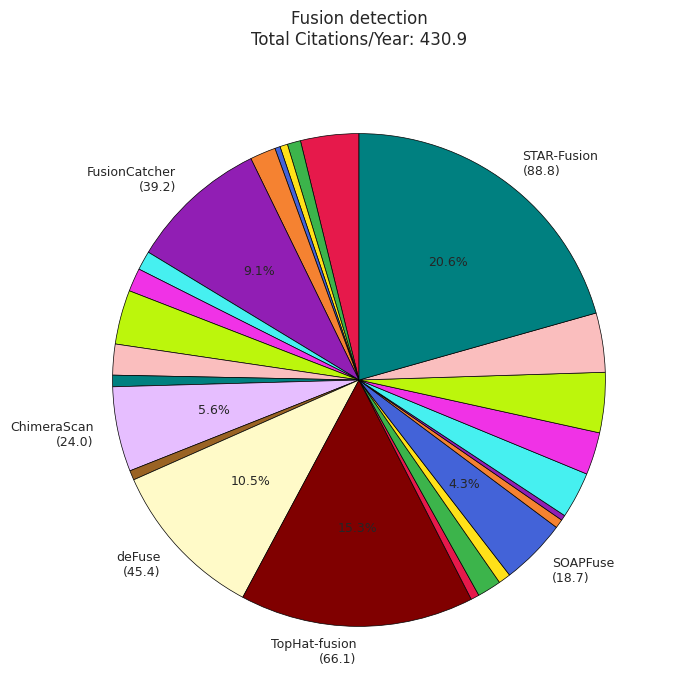

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


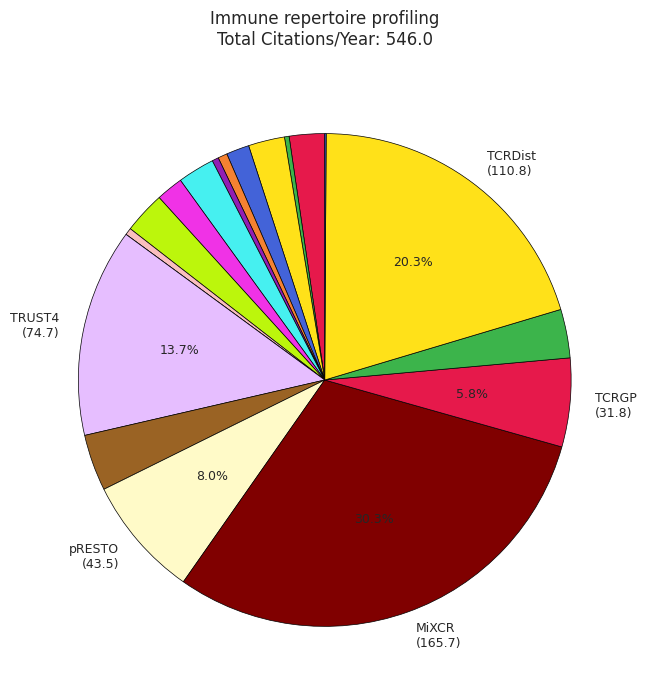

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


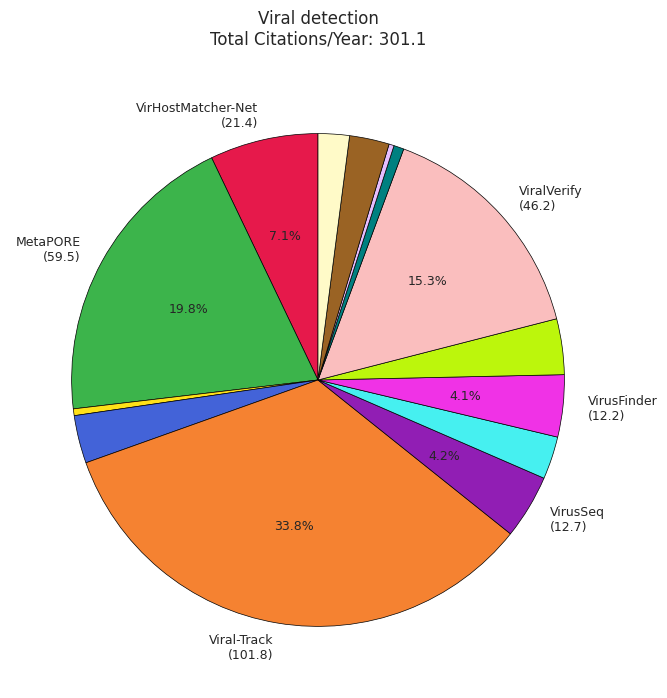

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


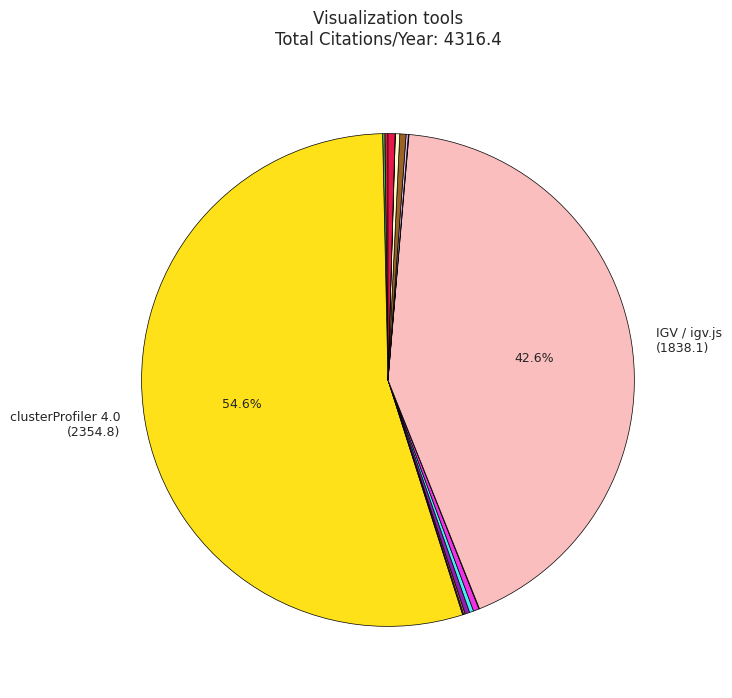

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


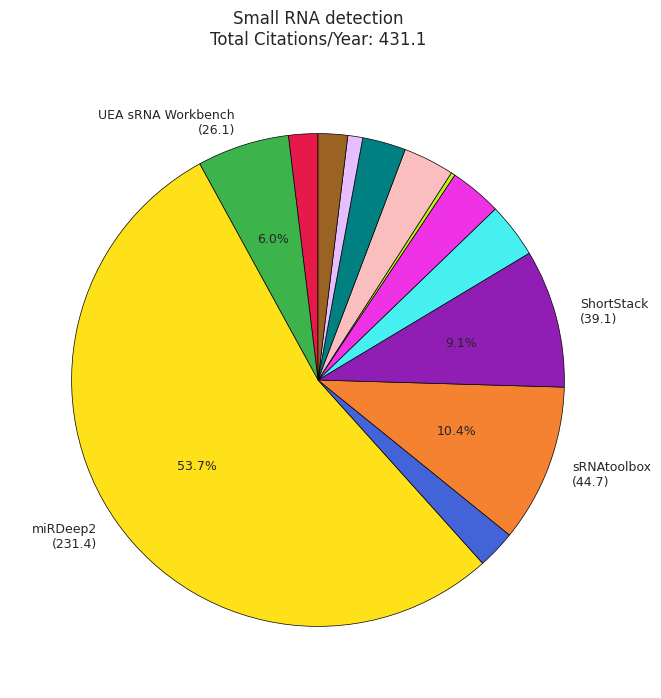

/tmp/ipython-input-3685300731.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100


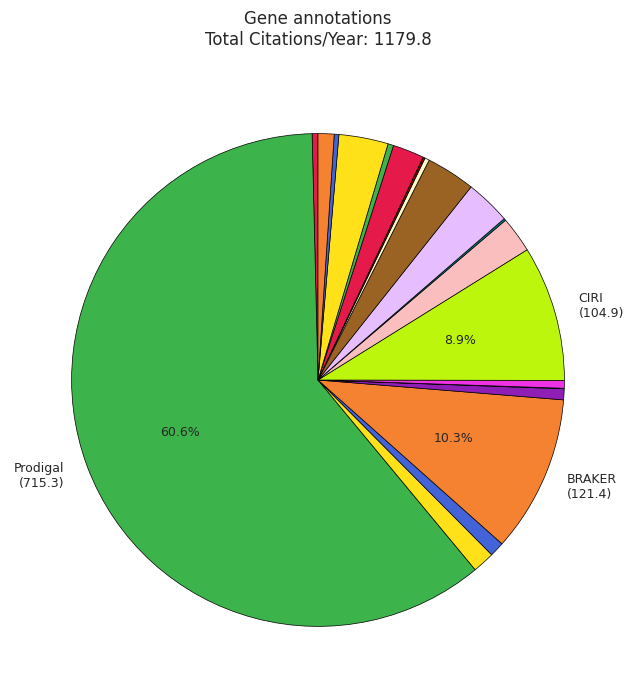

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load and clean data
file_path = "/content/data.csv"
data = pd.read_csv(file_path)
data = data.dropna(subset=['Citations per year'])

# Define custom domain order and colors
custom_order = [
    'Read alignment', 'Transcriptome quantification', 'Differential expression',
    'Data quality control', 'Allele specific expression', 'Transcriptome assembly',
    'RNA splicing', 'Cell deconvolution', 'Detecting circRNA', 'Fusion detection',
    'Immune repertoire profiling', 'Viral detection', 'Visualization tools',
    'Small RNA detection', 'Gene annotations'
]

custom_colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231',
    '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe',
    '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000'
]

# Create individual pie charts for each domain
for domain in custom_order:
    domain_data = data[data['Domain'] == domain]

    if domain_data.empty:
        print(f"No data available for {domain}")
        continue

    # Calculate total citations and filter tools ≥5%
    total = domain_data['Citations per year'].sum()
    domain_data['Percentage'] = (domain_data['Citations per year'] / total) * 100

    # Prepare labels - only show for ≥5%
    labels = []
    for _, row in domain_data.iterrows():
        if row['Percentage'] >= 4:
            labels.append(f"{row['Tool names']}\n({row['Citations per year']:.1f})")
        else:
            labels.append("")

    # Create figure for this domain
    plt.figure(figsize=(8, 8))
    wedges, texts, autotexts = plt.pie(
        domain_data['Citations per year'],
        labels=labels,
        autopct=lambda p: f'{p:.1f}%' if p >= 4 else '',
        startangle=90,
        colors=custom_colors[:len(domain_data)],
        wedgeprops={'edgecolor': 'black', 'linewidth': 0.5},
        textprops={'fontsize': 9}
    )

    # Adjust label appearance
    plt.setp(texts + autotexts, fontsize=9)
    plt.title(f"{domain}\nTotal Citations/Year: {total:.1f}", fontsize=12, pad=20)

    # Save each figure (optional)
    # plt.savefig(f"{domain}_citations_pie.png", bbox_inches='tight', dpi=300)

    plt.show()

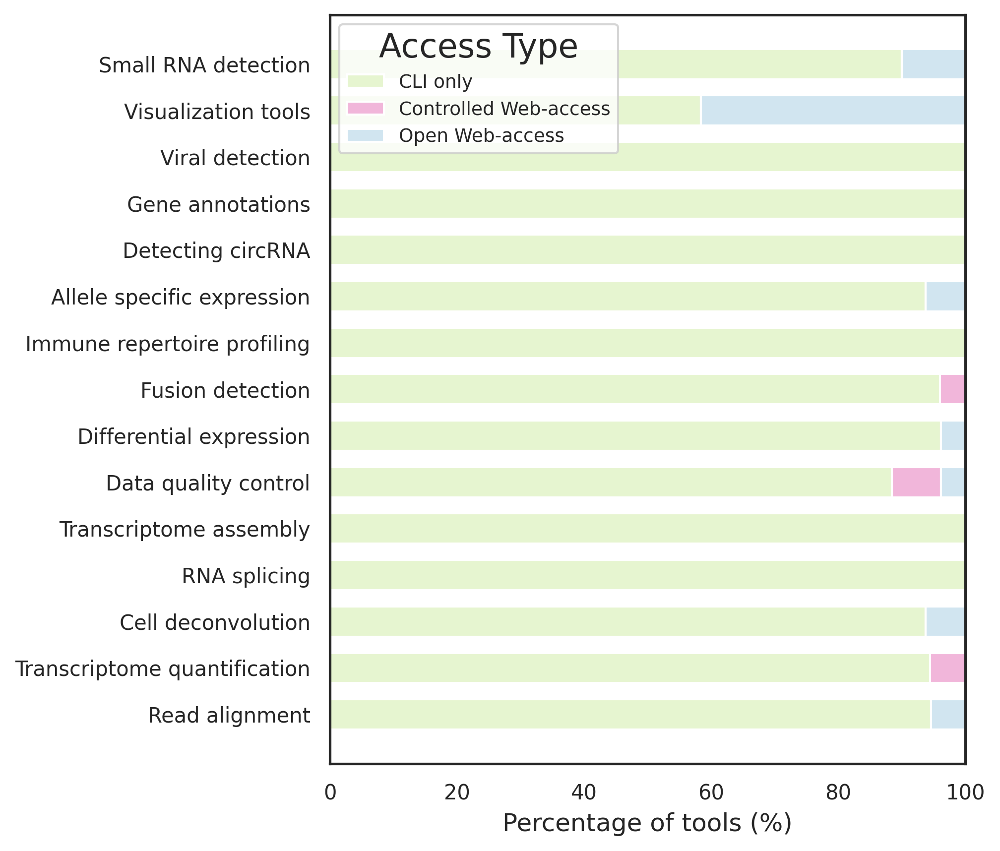

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load dataset
file_path = "/content/data.csv"
data = pd.read_csv(file_path)
data.columns = data.columns.str.strip()
data['Domain'] = data['Domain'].astype(str).str.strip()

def to_bin(val):
    return 1 if str(val).strip().upper() == 'Y' else 0

data['Command-line'] = data['Command-line'].apply(to_bin)
data['Web-based'] = data['Web-based'].apply(to_bin)
data['Controlled access'] = data['Controlled access (for web-based): does it require login or sign up or payment?'].apply(to_bin)

# Assign categories: only one category per tool
def classify_tool(row):
    if row['Command-line'] == 1 and row['Web-based'] == 0:
        return 'CLI only'
    elif row['Command-line'] == 0 and row['Web-based'] == 1 and row['Controlled access'] == 1:
        return 'Controlled Web-access'
    elif row['Command-line'] == 0 and row['Web-based'] == 1 and row['Controlled access'] == 0:
        return 'Open Web-access'
    else:
        return np.nan  # Exclude ambiguous/mixed-access tools from plot

data['Access Type'] = data.apply(classify_tool, axis=1)
data = data.dropna(subset=['Access Type'])

# Get counts per domain
domain_counts = data.groupby(['Domain', 'Access Type']).size().unstack(fill_value=0)

# Calculate percentages
domain_sums = domain_counts.sum(axis=1)
domain_percents = domain_counts.div(domain_sums, axis=0) * 100

# Reorder columns for consistency
domain_percents = domain_percents[['CLI only', 'Controlled Web-access', 'Open Web-access']]

# Sort domains by total number of tools for better visualization (optional)
sorted_domains = domain_sums.sort_values(ascending=False).index
domain_percents = domain_percents.loc[sorted_domains]

# Plot
colors = ['#e6f5d0', '#f1b6da', '#d1e5f0']
fig, ax = plt.subplots(figsize=(7, max(3, 0.4*len(domain_percents))), dpi=300)

bottom = np.zeros(len(domain_percents))
for idx, col in enumerate(domain_percents.columns):
    vals = domain_percents[col].values
    ax.barh(domain_percents.index, vals, left=bottom, color=colors[idx], label=col, height=0.65)
    bottom += vals

# Labels and legend
ax.set_xlabel('Percentage of tools (%)', fontsize=12)
ax.set_ylabel('')
ax.set_xlim(0, 100)
ax.set_xticks([0, 20, 40, 60, 80, 100])
ax.tick_params(axis='y', labelsize=10)
ax.tick_params(axis='x', labelsize=10)
ax.legend(fontsize=9, title='Access Type')
plt.tight_layout()
plt.show()


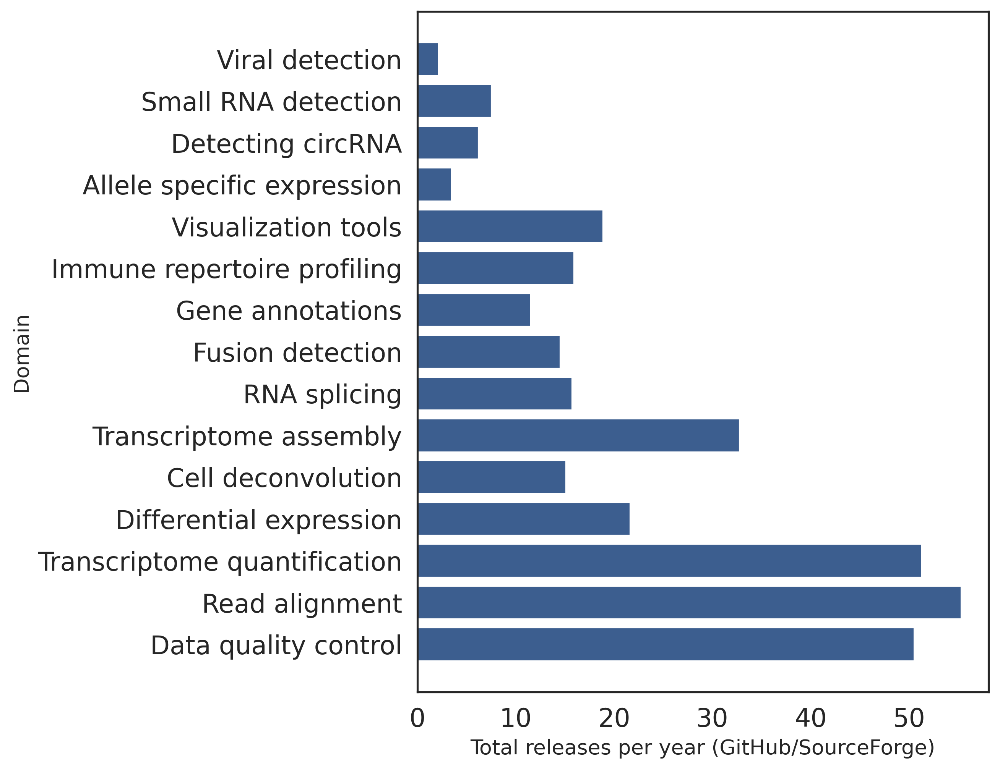

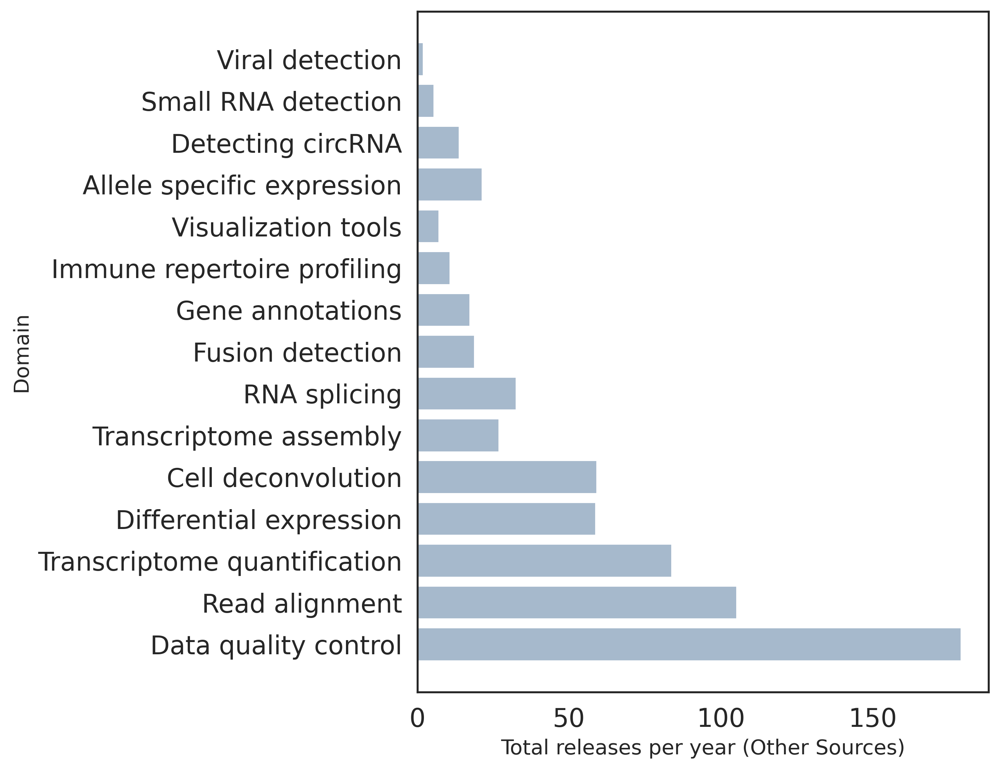

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load dataset
file_path = "/content/data.csv"
data = pd.read_csv(file_path)
data.columns = data.columns.str.strip()
data['Domain'] = data['Domain'].astype(str).str.strip()

# List of release columns
release_cols_per_year = [
    'Number of Releases per Year for standalone website',
    'Number of releases per year for Anaconda',
    'Number of releases per year for Pypi',
    'Number of releases per year for CRAN',
    'Number of releases per year for Bioconductor',
    'Number of releases per year for github and source forge'
]

# Convert to numeric
for col in release_cols_per_year:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# GitHub/SourceForge and Others
github_col = 'Number of releases per year for github and source forge'
other_cols = [col for col in release_cols_per_year if col != github_col]

# Calculate total releases per tool from each group
data['releases_github'] = data[github_col].fillna(0)
data['releases_other'] = data[other_cols].sum(axis=1, skipna=True)

# Sum up total releases per domain
github_sum = data.groupby('Domain')['releases_github'].sum()
other_sum = data.groupby('Domain')['releases_other'].sum()

# Sort domains by total releases (descending) for plotting order
domain_order = (github_sum + other_sum).sort_values(ascending=False).index.tolist()

# Reindex for consistent plotting order
github_sum = github_sum.reindex(domain_order)
other_sum = other_sum.reindex(domain_order)

# Plot settings
plt.figure(figsize=(9, 7), dpi=300)

# --- Figure 1: GitHub/SourceForge releases ---
plt.barh(github_sum.index, github_sum.values, color="#3c5e8f")
plt.xlabel("Total releases per year (GitHub/SourceForge)", fontsize=13)
plt.ylabel("Domain", fontsize=13)
plt.title("", fontsize=14, pad=14)
plt.tight_layout()
plt.show()

# --- Figure 2: Other releases ---
plt.figure(figsize=(9, 7), dpi=300)
plt.barh(other_sum.index, other_sum.values, color="#a6b9cc")
plt.xlabel("Total releases per year (Other Sources)", fontsize=13)
plt.ylabel("Domain", fontsize=13)
plt.title("", fontsize=14, pad=14)
plt.tight_layout()
plt.show()


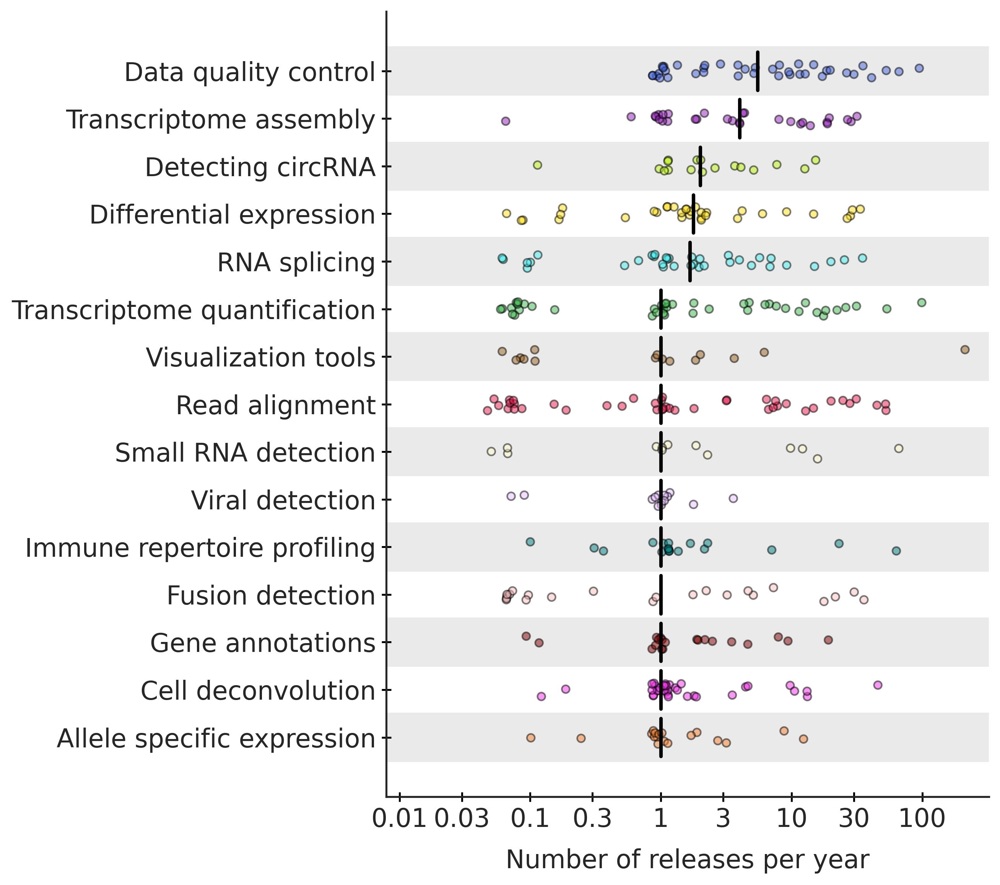

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# --- Standardized Style ---
LABEL_FONT_SIZE = 16
TICK_FONT_SIZE = 16
FONT_FAMILY = 'DejaVu Sans'
FIG_SIZE = (9, 8)

plt.rcParams.update({
    'font.size': LABEL_FONT_SIZE,
    'font.family': FONT_FAMILY,
    'axes.labelsize': LABEL_FONT_SIZE,
    'axes.titlesize': LABEL_FONT_SIZE,
    'xtick.labelsize': TICK_FONT_SIZE,
    'ytick.labelsize': TICK_FONT_SIZE,
    'legend.fontsize': LABEL_FONT_SIZE,
    'legend.title_fontsize': LABEL_FONT_SIZE
})

# --- Custom colors and domain order ---
custom_order = [
    'Read alignment', 'Transcriptome quantification', 'Differential expression',
    'Data quality control', 'Allele specific expression', 'Transcriptome assembly',
    'RNA splicing', 'Cell deconvolution', 'Detecting circRNA', 'Fusion detection',
    'Immune repertoire profiling', 'Viral detection', 'Visualization tools',
    'Small RNA detection', 'Gene annotations'
]
custom_colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231',
    '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe',
    '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000'
]

# Load your dataset
file_path = "/content/data.csv"
data = pd.read_csv(file_path)

# Clean column names and domain values
data.columns = data.columns.str.strip()
data['Domain'] = data['Domain'].astype(str).str.strip()

# Release columns
release_cols_per_year = [
    'Number of Releases per Year for standalone website',
    'Number of releases per year for Anaconda',
    'Number of releases per year for Pypi',
    'Number of releases per year for CRAN',
    'Number of releases per year for Bioconductor',
    'Number of releases for Github/Sourceforge'
]

# Ensure numeric conversion
for col in release_cols_per_year:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Prepare data
df = data.dropna(subset=release_cols_per_year, how='all').copy()
df['Total_releases_per_year'] = df[release_cols_per_year].sum(axis=1, skipna=True)
df = df[df['Total_releases_per_year'] > 0]
df['Repo_release_per_year'] = df[release_cols_per_year].max(axis=1, skipna=True)
df = df[df['Repo_release_per_year'] > 0]
df['release_log10'] = np.log10(df['Repo_release_per_year'])

# Sort domains by median for y-axis order
domain_medians = df.groupby('Domain')['release_log10'].median().sort_values()
sorted_domains = list(domain_medians.index)
domain_to_y = {domain: i for i, domain in enumerate(sorted_domains)}
df['domain_y'] = df['Domain'].map(domain_to_y)

# Jitter for better visualization
np.random.seed(1)
jitter_strength_x = 0.07
jitter_strength_y = 0.3
df['release_log10_jitter'] = df['release_log10'] + np.random.uniform(-jitter_strength_x, jitter_strength_x, size=len(df))
df['domain_y_spaced'] = df['domain_y'] * 2 + np.random.uniform(-jitter_strength_y, jitter_strength_y, size=len(df))

# Map domains to colors
domain_color_map = dict(zip(custom_order, custom_colors))
default_color = "#AAAAAA"
df['color'] = df['Domain'].map(domain_color_map).fillna(default_color)

# --- Plot ---
fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=300)

# Background shading (optional, currently enabled)
for i in range(len(sorted_domains)):
    y_val = i * 2
    if i % 2 == 0:
        ax.axhspan(y_val - 1, y_val + 1, color="#eaeaea", zorder=0)

# Scatter: colored dots by domain
ax.scatter(
    df['release_log10_jitter'],
    df['domain_y_spaced'],
    c=df['color'],
    edgecolor='black',
    marker='o',
    s=24,
    alpha=0.5,
    zorder=10
)

# Median lines for each domain
for i, dom in enumerate(sorted_domains):
    dom_df = df[df['Domain'] == dom]
    if len(dom_df) == 0:
        continue
    median_x = dom_df['release_log10'].median()
    y_val = i * 2
    ax.plot([median_x, median_x], [y_val - 0.8, y_val + 0.8], color='black', lw=2.2, zorder=20)

# X-ticks (log scale, human-readable)
tick_labels = [0.01, 0.03, 0.1, 0.3, 1, 3, 10, 30, 100]
tick_positions = np.log10(tick_labels)
ax.set_xticks(tick_positions)
ax.set_xticklabels([str(x) for x in tick_labels])
ax.set_xlim(left=min(tick_positions) - 0.1)

# Y-ticks
ax.set_yticks([i * 2 for i in range(len(sorted_domains))])
ax.set_yticklabels(sorted_domains, fontsize=LABEL_FONT_SIZE)

# Labels
ax.set_xlabel('Number of releases per year', fontsize=LABEL_FONT_SIZE, labelpad=10)
ax.set_ylabel('', fontsize=LABEL_FONT_SIZE)

# Ticks
ax.tick_params(axis='x', which='both', direction='inout', length=6, width=1.2,
               color='black', bottom=True, labelsize=LABEL_FONT_SIZE)
ax.tick_params(axis='y', which='both', direction='inout', length=6, width=1.2,
               color='black', left=True, labelsize=LABEL_FONT_SIZE)

# Spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

plt.tight_layout()
plt.show()

=== Each Pie Slice (Grouped Licenses) ===
Slice: 'GPL' (156 tools)
Slice: 'Licensure unclear' (118 tools)
Slice: 'MIT' (71 tools)
Slice: 'Academic' (37 tools)
Slice: 'Boost Software License' (21 tools)
Slice: 'Artistic-2.0' (14 tools)
Slice: 'Creative Commons' (8 tools)
Slice: 'Less common licenses' (7 tools)

Still uncategorized in 'Less common licenses':
  Apache (7 tools)

--- End of breakdown ---


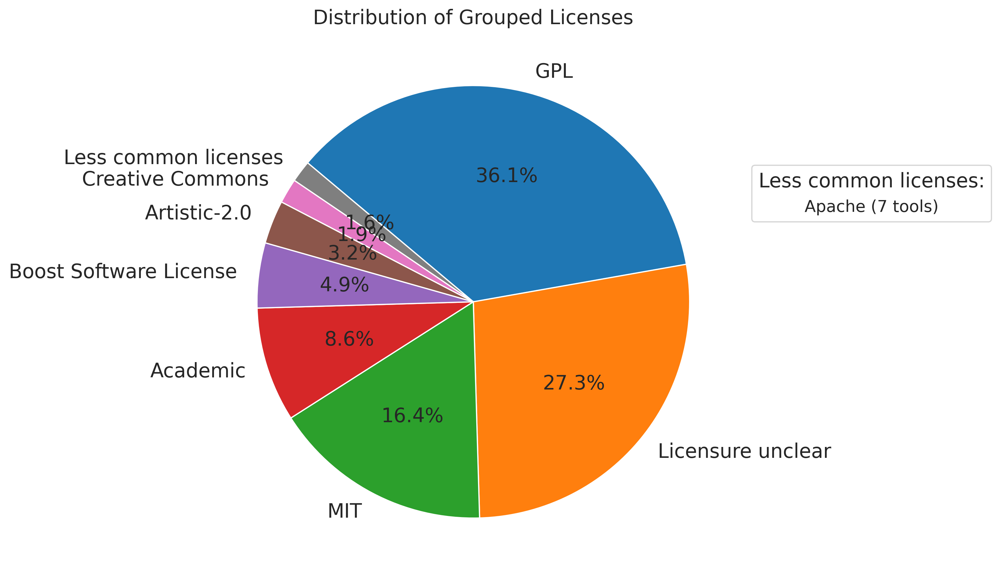

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import re

# ---------------------------------------
# Load the dataset
# ---------------------------------------
file_path = '/content/data.csv'
df = pd.read_csv(file_path)

# ---------------------------------------
# Helpers: normalize text
# ---------------------------------------
def _norm(s):
    if pd.isna(s):
        return ''
    s = str(s).replace('\xa0', ' ')           # normalize non-breaking spaces
    s = re.sub(r'\s+', ' ', s)                # collapse weird whitespace
    return s.strip().lower()

# ---------------------------------------
# Grouping function (with "Free" moved into Academic)
# ---------------------------------------
def group_license(val):
    if pd.isna(val):
        return 'Licensure unclear'
    v = _norm(val)

    # --- Licensure unclear cases ---
    unclear_terms = {
        'n', 'na', 'nan', '', 'none', 'n/a',
        'no license',
        'no license in neither the github webpage nor the github repo page',
        'na due to links being broken',
        'no license info',
        're',
        'n/a due to broken link',
        'https://github.com/liubioinfo/mapsplice?tab=license-1-ov-file',
        'no official license',
        'uniq, rsem, cufflinks, rescue, uniqln'
    }
    if v in unclear_terms:
        return 'Licensure unclear'

    # --- Academic overrides (including Free now) ---
    academic_overrides = (
        'free',                      # Free -> Academic
        'mozilla public license',    # MPL -> Academic
        'copyright',                 # Copyright -> Academic
        'eupl',                      # EUPL -> Academic
        'iscl',                      # ISCL (Open source) -> Academic
        'cecill',                    # CeCILL -> Academic
        'public domain',             # Public Domain -> Academic
        'common public license'      # Common Public License -> Academic
    )
    if any(tok in v for tok in academic_overrides):
        return 'Academic'

    # --- Specific re-mappings ---
    if v in {'"no license or account needed."'}:
        return 'Academic'  # moved into Academic instead of separate "Free"

    # --- Open-source families (coarse grouping) ---
    if ('gpl' in v) or ('gnu' in v) or ('lgpl' in v) or ('agpl' in v) or ('general public license' in v):
        return 'GPL'
    if v.startswith('mit') or 'permission is hereby granted' in v:
        return 'MIT'
    if ('bsd' in v) or ('bds' in v) or ('boost software license' in v) or ('bsl' in v):
        return 'Boost Software License'
    if 'apache' in v:
        return 'Apache'
    if 'artistic' in v:
        return 'Artistic-2.0'
    if ('creative commons' in v) or ('cc by' in v) or ('cc by nc 4.0' in v):
        return 'Creative Commons'

    # --- Academic (general cues) ---
    academic_keywords = [
        'university', 'uni.', 'uc ', 'ucsf', 'academic', 'bcca', 'broad institute',
        'ludwig institute', 'cancer agency', 'milaboratories', 'pennsylvania copyright',
        'non commercial', 'non-commercial', 'free for academic'
    ]
    if any(word in v for word in academic_keywords):
        return 'Academic'

    # --- Default: return original (human-readable) ---
    return str(val).strip()

# ---------------------------------------
# Apply grouping
# ---------------------------------------
df['License_grouped'] = df['License'].apply(group_license)
license_counts = df['License_grouped'].value_counts()

# ---------------------------------------
# Aggregate rare groups into "Less common licenses"
# ---------------------------------------
threshold = 8
main_licenses = license_counts[license_counts >= threshold]
less_common = license_counts[license_counts < threshold]

pie_labels = list(main_licenses.index)
pie_values = list(main_licenses.values)
if not less_common.empty:
    pie_labels.append('Less common licenses')
    pie_values.append(less_common.sum())

# Legend entries for "Less common"
legend_labels = []
if not less_common.empty:
    for lic, count in less_common.items():
        legend_labels.append(f"{lic} ({count} tools)")

# ---------------------------------------
# Debug printout
# ---------------------------------------
print("=== Each Pie Slice (Grouped Licenses) ===")
for label, value in zip(pie_labels, pie_values):
    print(f"Slice: '{label}' ({value} tools)")
if legend_labels:
    print("\nStill uncategorized in 'Less common licenses':")
    for l in legend_labels:
        print("  " + l)
print("\n--- End of breakdown ---")

# ---------------------------------------
# Plot
# ---------------------------------------
fig, ax = plt.subplots(figsize=(10, 8), dpi=300)
wedges, texts, autotexts = ax.pie(
    pie_values,
    labels=pie_labels,
    autopct='%1.1f%%',
    startangle=140,
    counterclock=False,
    wedgeprops={'edgecolor': 'white', 'linewidth': 1}
)

if legend_labels:
    plt.legend(
        handles=[plt.Line2D([0], [0], color="none")] * len(legend_labels),
        labels=legend_labels,
        title='Less common licenses:',
        loc='center left',
        bbox_to_anchor=(1, 0.7),
        fontsize='small',
        handlelength=0,
        handletextpad=0,
        markerscale=0
    )

plt.title('Distribution of Grouped Licenses')
plt.tight_layout()
plt.show()


/tmp/ipython-input-4195957734.py:18: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data[col] = data[col].astype(str).str.strip().str.lower().map({'y': True, 'yes': True, 'n': False, 'no': False}).fillna(False)


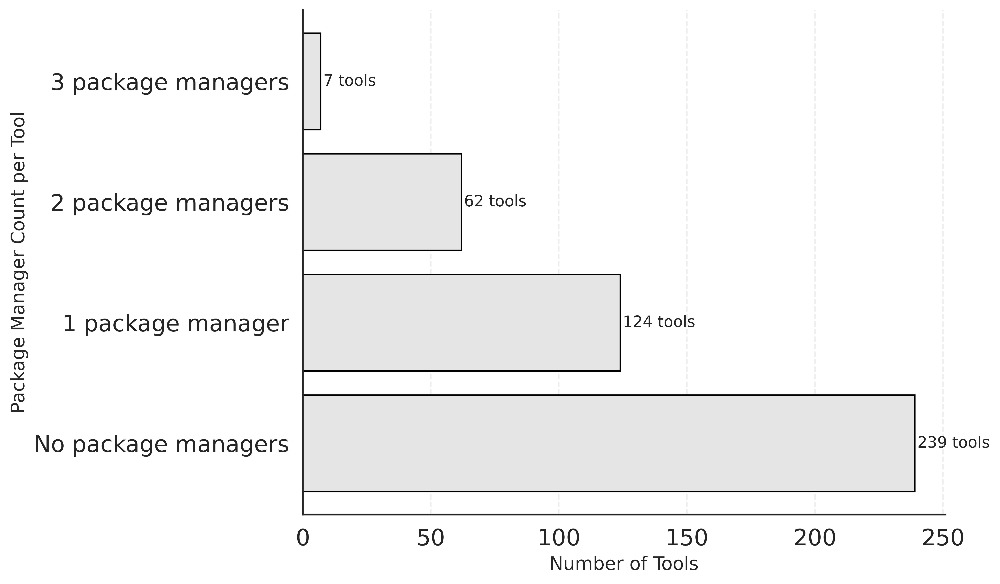

Number of tools (rows) in data: 432
Sum of all bars: 432
Any NaN in num_package_managers? 0
No package managers: 239 tools (55.3%)
1 package manager: 124 tools (28.7%)
2 package managers: 62 tools (14.4%)
3 package managers: 7 tools (1.6%)


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
data = pd.read_csv('/content/data.csv')

# Relevant package manager columns (excluding mamba)
package_manager_cols = [
    'Package manager availability - Anaconda',
    'Package manager availability - Bioconductor',
    'Package manager availability - R package manager (includes CRAN)',
    'Package manager availability - Python based package manager (includes pypi)',
    'Package manager availability - Other (homebrew and ubuntu)'
]

# Standardize and convert to boolean, treating NaN/blank as False
for col in package_manager_cols:
    data[col] = data[col].astype(str).str.strip().str.lower().map({'y': True, 'yes': True, 'n': False, 'no': False}).fillna(False)

# Calculate number of package managers per tool
data['num_package_managers'] = data[package_manager_cols].sum(axis=1)

# Count how many tools have 0, 1, 2, ... package managers
pm_counts = data['num_package_managers'].value_counts().sort_index()

# Create human-readable labels
def create_label(count):
    return "No package managers" if count == 0 else f"{count} package manager{'s' if count > 1 else ''}"

labels = [create_label(x) for x in pm_counts.index]

# Plot
fig, ax = plt.subplots(figsize=(10, 6), dpi=600)
bars = ax.barh(
    labels,
    pm_counts.values,
    color='#e5e5e5',
    edgecolor='black',
    linewidth=1
)

# Add value labels
for bar in bars:
    width = bar.get_width()
    ax.text(width + 1, bar.get_y() + bar.get_height() / 2,
            f'{int(width)} tools', va='center', fontsize=11)

# Axis labels and style
ax.set_xlabel('Number of Tools', fontsize=13)
ax.set_ylabel('Package Manager Count per Tool', fontsize=13)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(axis='x', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()

# Print summary
print("Number of tools (rows) in data:", len(data))
print("Sum of all bars:", pm_counts.sum())
print("Any NaN in num_package_managers?", data['num_package_managers'].isna().sum())

for count, n_tools in pm_counts.items():
    print(f"{create_label(count)}: {n_tools} tools ({n_tools / len(data) * 100:.1f}%)")


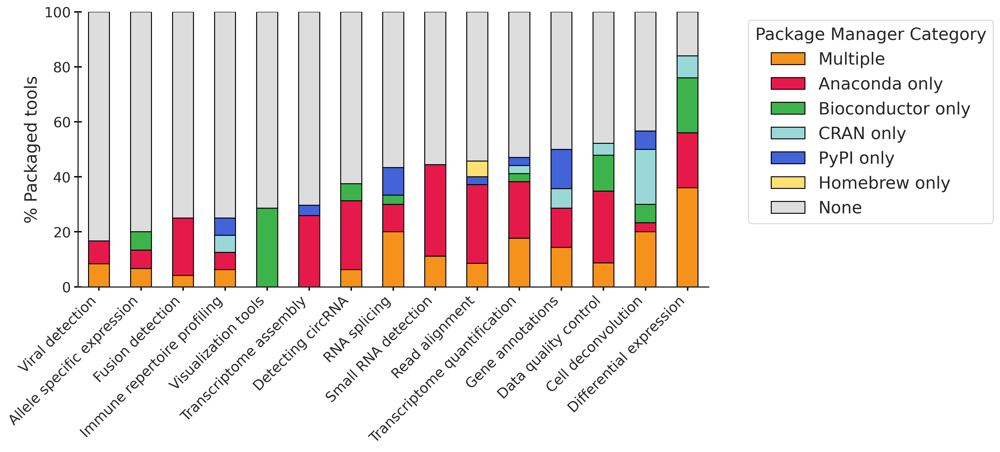

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
file_path = "/content/data.csv"
data = pd.read_csv(file_path)
data.columns = data.columns.str.strip()
data['Domain'] = data['Domain'].astype(str).str.strip()

# Keep only command-line only tools (not both)
data = data[(data['Command-line'] == 'Y') & (data['Web-based'] != 'Y')]

pm_cols = [
    'Package manager availability - Anaconda',
    'Package manager availability - Bioconductor',
    'Package manager availability - R package manager (includes CRAN)',
    'Package manager availability - Python based package manager (includes pypi)',
    'Package manager availability - Other (homebrew and ubuntu)'
]
pm_legend = ['Anaconda', 'Bioconductor', 'CRAN', 'PyPI', 'Homebrew']

# Clean up and normalize
for col in pm_cols:
    data[col] = data[col].astype(str).str.strip().str.upper().replace({'YES': 'Y'})
    data[col] = data[col].apply(lambda x: 1 if x == 'Y' else 0)

# Re-label Homebrew only
pm_cols[-1] = 'Package manager availability - Homebrew'
data[pm_cols[-1]] = data['Package manager availability - Other (homebrew and ubuntu)']

# Build tool-by-tool summary
def categorize_row(row):
    active_pms = [i for i, col in enumerate(pm_cols) if row[col] == 1]
    if len(active_pms) == 0:
        return 'None'
    elif len(active_pms) == 1:
        return pm_legend[active_pms[0]] + ' only'
    else:
        return 'Multiple'

data['PM_category'] = data.apply(categorize_row, axis=1)

categories = [
    'Multiple',
    'Anaconda only', 'Bioconductor only', 'CRAN only', 'PyPI only', 'Homebrew only',
    'None'
]
category_colors = [
    '#F5921B',    # Multiple (orange)
    '#e6194b',    # Anaconda (red)
    '#3cb44b',    # Bioconductor (green)
    '#9AD8D8',    # CRAN (teal)
    '#4363d8',    # PyPI (blue)
    '#FFE072',    # Homebrew (yellow)
    '#dddddd'     # None (light gray)
]

domain_cat_count = (
    data.groupby(['Domain', 'PM_category']).size()
    .unstack(fill_value=0)
    .reindex(columns=categories, fill_value=0)
)

# Convert to percent per domain
domain_totals = domain_cat_count.sum(axis=1).replace(0, 1)
percent_pm = domain_cat_count.div(domain_totals, axis=0) * 100

# Sort domains by percent of "None" (descending, biggest grey column first)
percent_pm = percent_pm.sort_values(by='None', ascending=False)

plt.figure(figsize=(15, 7), dpi=300)
ax = percent_pm.plot(
    kind='bar', stacked=True, color=category_colors, edgecolor='black', ax=plt.gca()
)

plt.ylabel('% Packaged tools', fontsize=18)
plt.xlabel('', fontsize=18)
plt.ylim(0, 100)
plt.xticks(rotation=45, ha='right', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(categories, bbox_to_anchor=(1.05, 1), loc='upper left', title='Package Manager Category',
           fontsize=18, title_fontsize=18)

# Keep only left and bottom spines (x and y axis)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

ax.tick_params(axis='x', which='major', direction='inout', length=8, width=1.5, color='black', bottom=True, labelsize=15)
ax.tick_params(axis='y', which='major', direction='inout', length=8, width=1.5, color='black', left=True, labelsize=15)

plt.tight_layout()
plt.show()


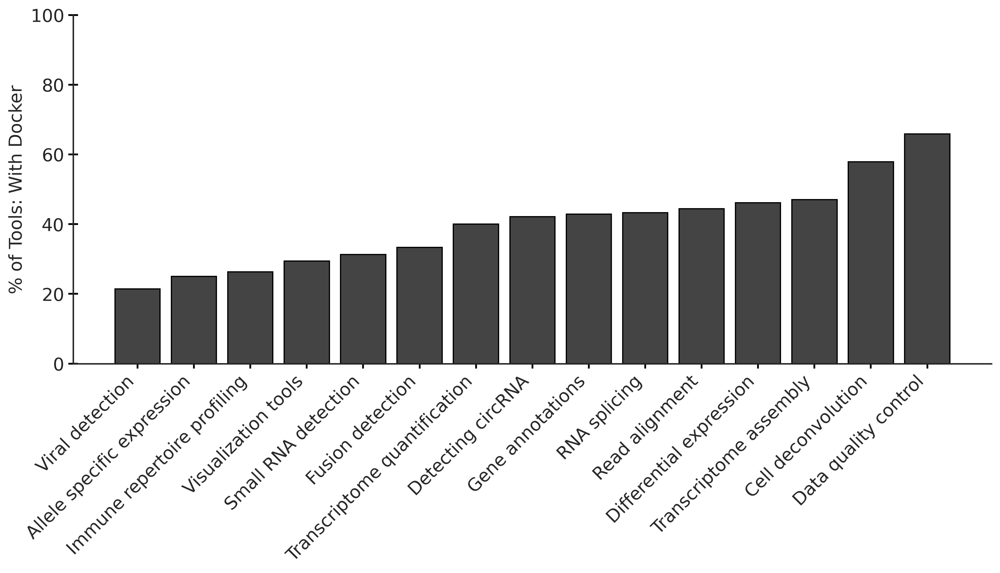

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load and prepare data
file_path = '/content/data.csv'
df = pd.read_csv(file_path)
df.columns = df.columns.str.strip()

# Only focus on Docker support
col = 'Docker support'
feature_label = 'With Docker'

df['Domain'] = df['Domain'].str.replace(r'^[a-zA-Z]\.\s*', '', regex=True).str.strip()
df[col] = df[col].astype(str).str.upper().str.strip().apply(lambda x: 'Y' if x == 'Y' else 'N')

# Calculate percentages of "Y" by domain
feature_counts = df.groupby(['Domain', col]).size().unstack(fill_value=0)
feature_percent = feature_counts.div(feature_counts.sum(axis=1), axis=0) * 100

# Sort by ascending order of "Y"
feature_percent = feature_percent.sort_values('Y', ascending=True)
sorted_domains = feature_percent.index.tolist()

plt.figure(figsize=(12, 7), dpi=300)
bars = plt.bar(
    sorted_domains,
    feature_percent['Y'],
    color='#444444', edgecolor='black'
)

plt.ylabel(f"% of Tools: {feature_label}", fontsize=15)
plt.xlabel('', fontsize=15)
plt.ylim(0, 100)
plt.xticks(rotation=45, ha='right', fontsize=15)
plt.yticks(fontsize=15)

ax = plt.gca()
# Remove all spines except left and bottom
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

# Add visible ticks for both axes (major only, in-out, bold)
ax.tick_params(axis='x', which='major', direction='inout', length=8, width=1.5,
               color='black', bottom=True, labelsize=15)
ax.tick_params(axis='y', which='major', direction='inout', length=8, width=1.5,
               color='black', left=True, labelsize=15)

plt.tight_layout()
plt.show()


In [ ]:
# pre2015 figure

Number of pre-2015 tools available on Anaconda: 66
Number of pre-2015 tools NOT available on Anaconda: 132


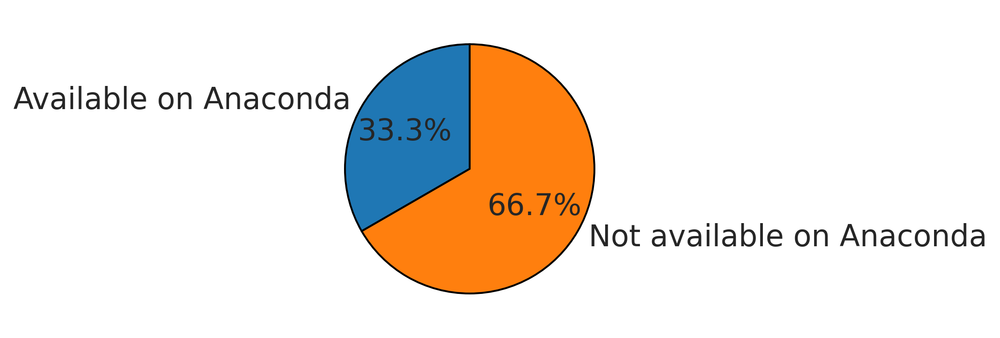

In [ ]:
# Filter tools published before 2015
df_pre2015 = df[df['Year Published'] < 2015].copy()

# Clean Anaconda column for consistency
df_pre2015['Package manager availability - Anaconda'] = df_pre2015['Package manager availability - Anaconda'].str.lower()

# Count tools by Anaconda availability
anaconda_counts = df_pre2015['Package manager availability - Anaconda'].value_counts()
# Ensure both categories exist
anaconda_counts = anaconda_counts.reindex(['y', 'n'], fill_value=0)

# Labels for the pie chart
labels = ['Available on Anaconda', 'Not available on Anaconda']

# Colors (optional, can customize)
colors = ['#1f77b4', '#ff7f0e']

# Print counts in console
print("Number of pre-2015 tools available on Anaconda:", anaconda_counts['y'])
print("Number of pre-2015 tools NOT available on Anaconda:", anaconda_counts['n'])

# Plot
plt.figure(figsize=(7, 7), dpi=300)
plt.pie(
    anaconda_counts,
    labels=labels,
    autopct='%1.1f%%',
    startangle=90,
    colors=colors,
    wedgeprops={'edgecolor': 'black'}
)
#plt.title('Distribution of pre-2015 tools by Anaconda availability', fontsize=LABEL_FONT_SIZE)
plt.tight_layout()
plt.show()


In [2]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency

# 1. Load Data
filename = "data.csv"
df = pd.read_csv(filename)

# 2. Clean Data & Calculate Metric
df['Year Published'] = pd.to_numeric(df['Year Published'], errors='coerce')
df['Number of citations'] = pd.to_numeric(df['Number of citations'], errors='coerce')

# Calculate Age-Normalized Citations
current_year = 2026
df['Age'] = current_year - df['Year Published']
# Avoid division by zero by replacing 0 age with 1
df['Citations_Per_Year'] = df['Number of citations'] / df['Age'].replace(0, 1)

# 3. Filter for "Pre-Bioconda" Era (Before 2015)
pre_2015 = df[df['Year Published'] < 2015].copy()

# 4. Define "On Bioconda"
pre_2015['On_Bioconda'] = (
    (pre_2015['Package manager availability - Anaconda'].astype(str).str.strip().str.upper() == 'Y') |
    (pre_2015['Storage location anaconda'].astype(str).str.contains('bioconda', case=False, na=False))
)

# 5. Split into High/Low Adoption using NEW Metric
median_metric = pre_2015['Citations_Per_Year'].median()
pre_2015['Adoption_Group'] = np.where(
    pre_2015['Citations_Per_Year'] > median_metric,
    'High Adoption',
    'Low Adoption'
)

# 6. Statistical Test
counts = pre_2015.groupby('Adoption_Group')['On_Bioconda'].value_counts().unstack(fill_value=0)
obs = [
    [counts.loc['High Adoption', True], counts.loc['High Adoption', False]],
    [counts.loc['Low Adoption', True], counts.loc['Low Adoption', False]]
]
chi2, p, dof, expected = chi2_contingency(obs)

print(f"Median Citations/Year: {median_metric:.4f}")
print(f"P-value: {p:.5e}")
print(f"High Adoption Rate: {counts.loc['High Adoption', True] / counts.loc['High Adoption'].sum():.2%}")
print(f"Low Adoption Rate: {counts.loc['Low Adoption', True] / counts.loc['Low Adoption'].sum():.2%}")

Median Citations/Year: 14.1538
P-value: 7.37261e-11
High Adoption Rate: 56.70%
Low Adoption Rate: 11.88%


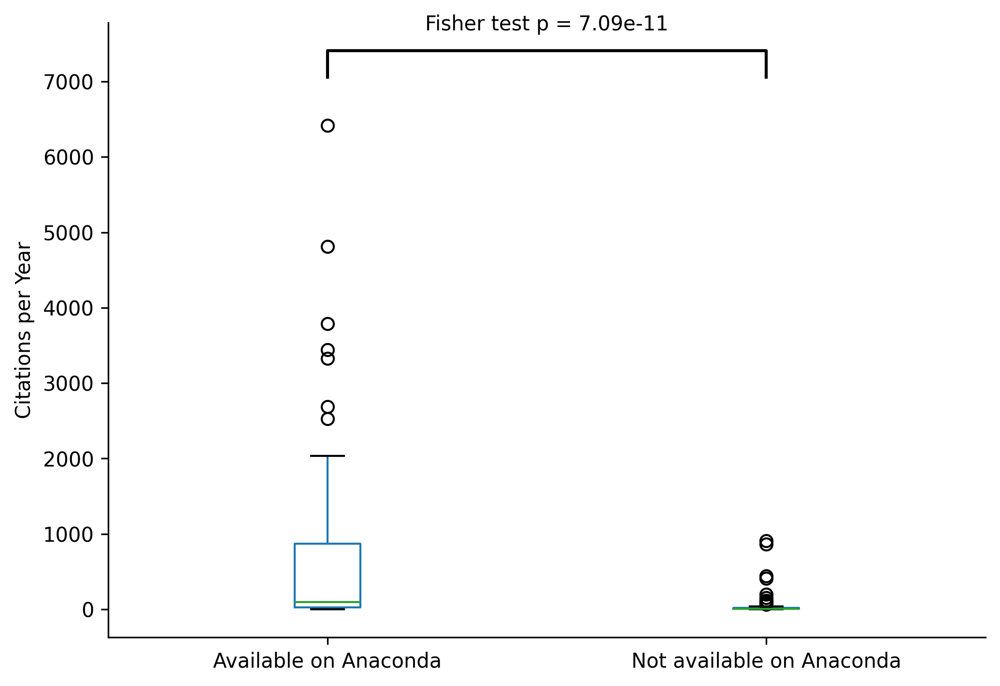

In [12]:
from scipy.stats import fisher_exact
import matplotlib.pyplot as plt

# Keep only relevant columns
plot_df = pre_2015[['Citations_Per_Year', 'On_Bioconda']].dropna()

# Convert boolean to labels
# Convert boolean to labels (NEW wording)
plot_df['Anaconda_Status'] = np.where(
    plot_df['On_Bioconda'],
    'Available on Anaconda',
    'Not available on Anaconda'
)


# Median split for Fisher test
median_val = plot_df['Citations_Per_Year'].median()
plot_df['High_Citation'] = plot_df['Citations_Per_Year'] > median_val

# Build contingency table
contingency = pd.crosstab(plot_df['High_Citation'], plot_df['On_Bioconda'])

# Fisher Exact Test
oddsratio, p_value = fisher_exact(contingency)

# ---- Plot ----
fig, ax = plt.subplots(figsize=(7,5), dpi=300)

plot_df.boxplot(column='Citations_Per_Year', by='Anaconda_Status', ax=ax)


# Remove automatic titles
ax.set_title('')
plt.suptitle('')

# Labels
ax.set_xlabel('')
ax.set_ylabel('Citations per Year')

# ---- Remove spines (TOP & RIGHT) ----
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# ---- Remove grid ----
ax.grid(False)

# ---- Significance line ----
y_max = plot_df['Citations_Per_Year'].max()
line_y = y_max * 1.1

ax.plot([1, 1, 2, 2],
        [line_y, line_y*1.05, line_y*1.05, line_y],
        lw=1.5, c='black')

ax.text(1.5, line_y*1.08, f"Fisher test p = {p_value:.2e}",
        ha='center', va='bottom')

plt.tight_layout()
plt.show()


In [ ]:
n_pre2015_on_anaconda = (
    df_pre2015['Package manager availability - Anaconda']
    .str.lower()
    .eq('y')
    .sum()
)

print("Number of tools published before 2015 and available on Anaconda:",
      n_pre2015_on_anaconda)


Number of tools published before 2015 and available on Anaconda: 66


In [ ]:
total_pre2015 = (df['Year Published'] < 2015).sum()
print("Total number of tools published prior to 2015:", total_pre2015)


Total number of tools published prior to 2015: 198
